Valencian Telecommunications, SA (VALTEL) es una compañía prestadora de servicios de telecomunicaciones que se ha especializado en ciudadanos no nacionales residentes en España. Su propuesta de valor es ofrecer packs económicos focalizados en las llamadas internacionales y la itinerancia de datos (roaming) y tarifas flexibles de datos.



En su plan estratégico, se contempla la diversificación de servicios y se plantea el diseño de nuevas áreas de la compañía dedicadas a comercializar a través de internet bienes de interés para el colectivo de ciudadanos no nacionales. Por medio de encuestas a sus clientes, se ha detectado que la compra de vehículos para ciudadanos no nacionales puede ser un potencial nicho, y, concretamente, el mercado de coches de segunda mano.



VALTEL desea ofertar dentro de su app móvil un servicio que permita a sus clientes buscar vehículos en venta y ofrecerles un precio competitivo. Para conocer dicho precio, el área de I+D ha conseguido un dataset (Coches_Segunda_Mano.csv) con las ventas de vehículos de segunda mano y encarga al área de Ciencia de Datos la estimación del precio de cada vehículo para poder elaborar una tarifa competitiva. 



Por tanto, el trabajo para realizar será el siguiente:



1)    Utilizar la metodología CRISP-DM para estimar el precio de un vehículo (campo Precio). Se recomienda utilizar como base el cuaderno del caso de repaso o bien BigML.

2)    Realizar una narrativa que comunique los hallazgos. Por simplicidad, se recomienda utilizar PowerPoint o equivalente para realizar la narrativa.



### 1. Entendimiento del problema

El objetivo del problema es, para futuros clientes de la compañía, ofertarles un precio competitivo para el coche que se busque.

El beneficio será una mayor posibilidad de compra de dicho coche debido a su precio. 

Para esto disponemos de un dataset con las ventas de vehículos de segunda mano. 

### 2. Entendimiento de los datos

In [1]:
# Cargamos el dataset

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotnine import *
from sklearn import linear_model
import sklearn.metrics
from scipy import stats
from statsmodels.graphics.gofplots import qqline
import statsmodels.api as sm 
import pylab as py 
import statsmodels.stats.api as sms 



coches = pd.read_csv('Coches_Segunda_Mano.csv')
coches.head()

,Marca,Modelo,Año,Combustible,CV,Cilindros,Transmisión,Tracción,Puertas,Mercado,Tamaño,Estilo,Consumo Carretera,Consumo Ciudad,Popularidad,Precio
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26.0,19.0,3916,46135.0
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28.0,19.0,3916,40650.0
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28.0,20.0,3916,36350.0
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28.0,18.0,3916,29450.0
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28.0,18.0,3916,34500.0


Nuestra variable objetivo será el precio, mientras que el resto serán nuestras variables explicativas. Deberemos clasificar cada una de ellas para un mayor entendimiento.

In [2]:
# Cargamos un dataset hecho en Excel para analizar las variables
pd.set_option('display.max_colwidth', 999)
variables = pd.read_csv('Variables.csv', encoding='latin-1', sep=';')
variables

,Variables,Nivel,Cualitativa / Cuantitativa,Discreta / Continua,Justificación
0,Marca,Nominal,Cualitativa,Discreta,Es cualitativa y no existe un orden
1,Modelo,Nominal,Cualitativa,Discreta,"Es cualitativa y no existe un orden, al menos que yo conozca"
2,Año,Ordinal,Cualitativa,Discreta,"Podría pensarse como intervalo, pero considero que sumar o restar años carece de mucho sentido. Podríamos pensar esta variable casi como cualitativa"
3,Combustible,Nominal,Cualitativa,Discreta,Es cualitativa y no existe un orden
4,CV,Ratio,Cuantitativa,Discreta,"Al ser cuantitaiva, 0 tener sentido y no tener números negativos"
5,Cilindros,Ratio,Cuantitativa,Discreta,"Al ser cuantitaiva, 0 tener sentido y no tener números negativos"
6,Transmisión,Nominal,Cualitativa,Discreta,Es cualitativa y no existe un orden
7,Tracción,Nominal,Cualitativa,Discreta,Es cualitativa y no existe un orden
8,Puertas,Ordinal,Cualitativa,Discreta,"Podría ser ratio, pero considero que tiene más sentido si evitamos realizar aritmética sobre ella"
9,Mercado,Nominal,Cualitativa,Discreta,Es cualitativa y no existe un orden


### 3. Preparación de los datos

In [3]:
# Mostramos la distribución del dataset

coches.shape

# Tenemos como habíamos visto 16 atributos con 11914 registros. 

(11914, 16)

In [4]:
for i in coches.columns:
    print('Para', i, 'hay un',round(len(coches[coches[i].isna()])/len(coches)*100,2), '%', 'de valores nulos')

Para Marca hay un 0.0 % de valores nulos
Para Modelo hay un 0.0 % de valores nulos
Para Año hay un 0.0 % de valores nulos
Para Combustible hay un 0.03 % de valores nulos
Para CV hay un 0.58 % de valores nulos
Para Cilindros hay un 0.25 % de valores nulos
Para Transmisión hay un 0.0 % de valores nulos
Para Tracción hay un 0.0 % de valores nulos
Para Puertas hay un 0.05 % de valores nulos
Para Mercado hay un 31.41 % de valores nulos
Para Tamaño hay un 0.0 % de valores nulos
Para Estilo hay un 0.0 % de valores nulos
Para Consumo Carretera hay un 0.0 % de valores nulos
Para Consumo Ciudad hay un 0.0 % de valores nulos
Para Popularidad hay un 0.0 % de valores nulos
Para Precio hay un 0.0 % de valores nulos


Vemos que salvo para la variable Mercado, no hay muchos NA's. Eliminaremos los registros vacíos de todas las variables excepto mercado para evitar reducir demasiado el Dataset.

In [5]:
coches_red = coches.dropna(subset= coches.columns[(coches.columns != "Mercado")])
for i in coches_red.columns:
    print('Para', i, 'hay un',round(len(coches_red[coches_red[i].isna()])/len(coches_red)*100,2), '%', 'de valores nulos')


coches_red.shape

# Ahora contamos con 11812 registros

Para Marca hay un 0.0 % de valores nulos
Para Modelo hay un 0.0 % de valores nulos
Para Año hay un 0.0 % de valores nulos
Para Combustible hay un 0.0 % de valores nulos
Para CV hay un 0.0 % de valores nulos
Para Cilindros hay un 0.0 % de valores nulos
Para Transmisión hay un 0.0 % de valores nulos
Para Tracción hay un 0.0 % de valores nulos
Para Puertas hay un 0.0 % de valores nulos
Para Mercado hay un 31.56 % de valores nulos
Para Tamaño hay un 0.0 % de valores nulos
Para Estilo hay un 0.0 % de valores nulos
Para Consumo Carretera hay un 0.0 % de valores nulos
Para Consumo Ciudad hay un 0.0 % de valores nulos
Para Popularidad hay un 0.0 % de valores nulos
Para Precio hay un 0.0 % de valores nulos


(11812, 16)

In [6]:
# Realizamos algunas transformaciones sobre las variables

m = {'Compact' : 1, 'Midsize' : 2, 'Large' : 3}

coches_red['Tamaño'] = coches_red['Tamaño'].map(m)


C:\Users\javih\AppData\Local\Temp\ipykernel_17260\185504852.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Comenzamos con el análisis univariante

Con las variables nominales, calculando sus frecuencias relativas

########### Para  Marca ###########
               count
Marca               
Chevrolet   0.094396
Ford        0.073485
Volkswagen  0.068151
Toyota      0.062902
Dodge       0.052997


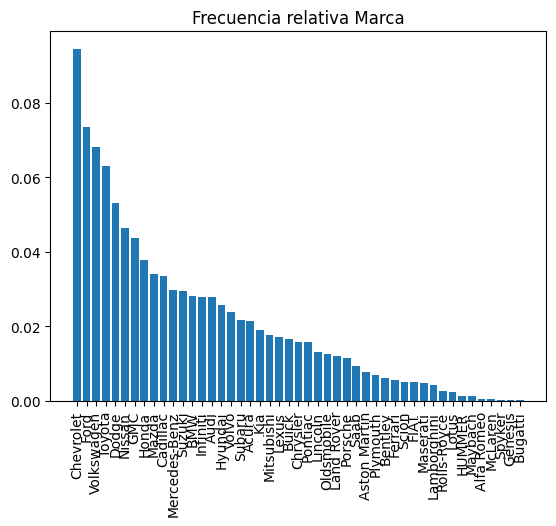

########### Para  Modelo ###########
                       count
Modelo                      
Silverado 1500      0.013207
Tundra              0.011852
F-150               0.010667
Sierra 1500         0.007619
Beetle Convertible  0.007535


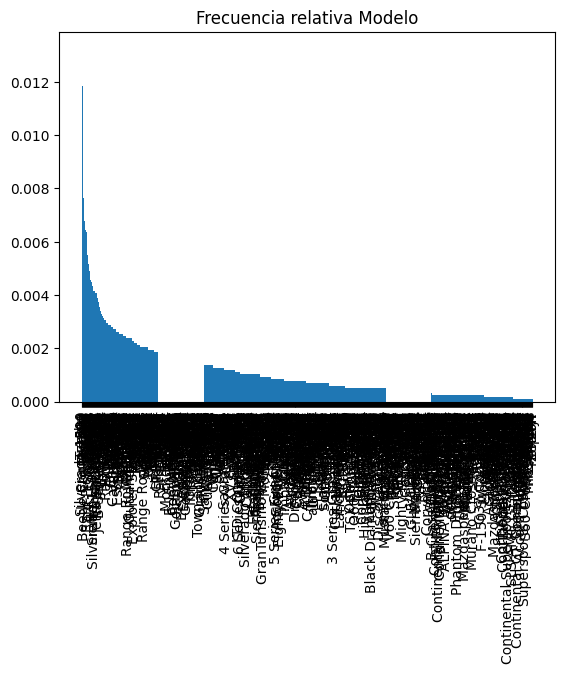

########### Para  Combustible ###########
                                   count
Combustible                             
regular unleaded                0.605740
premium unleaded (required)     0.168557
premium unleaded (recommended)  0.128598
flex-fuel (unleaded/E85)        0.076109
diesel                          0.012953


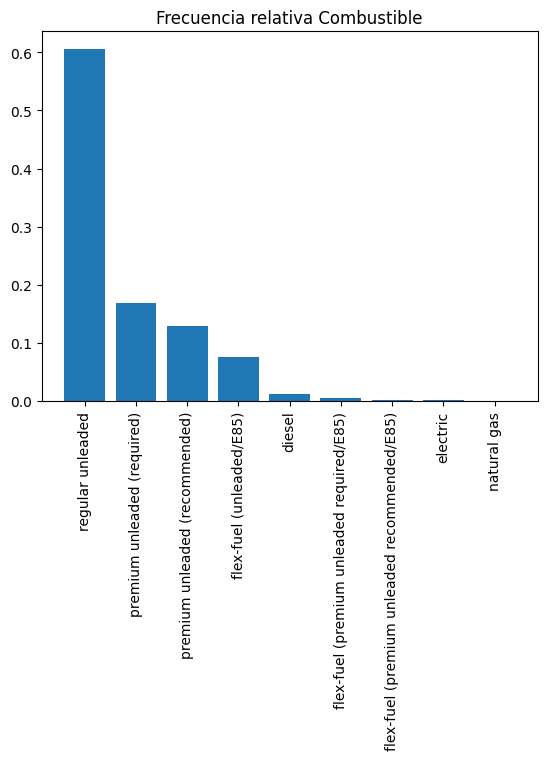

########### Para  Transmisión ###########
                     count
Transmisión               
AUTOMATIC         0.696834
MANUAL            0.247376
AUTOMATED_MANUAL  0.052912
UNKNOWN           0.001609
DIRECT_DRIVE      0.001270


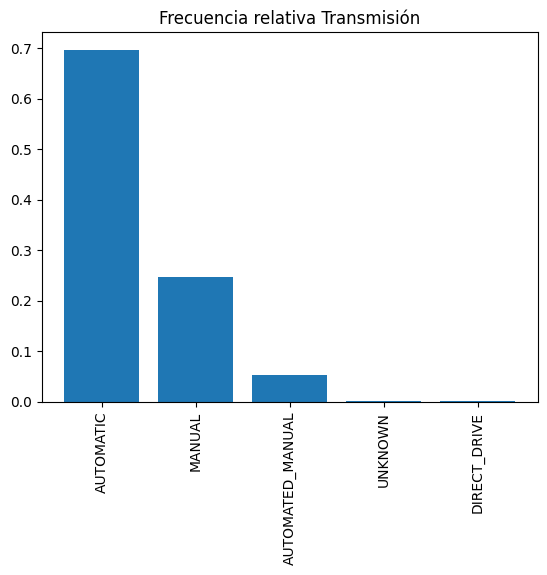

########### Para  Tracción ###########
                      count
Tracción                   
front wheel drive  0.400610
rear wheel drive   0.282848
all wheel drive    0.197765
four wheel drive   0.118778


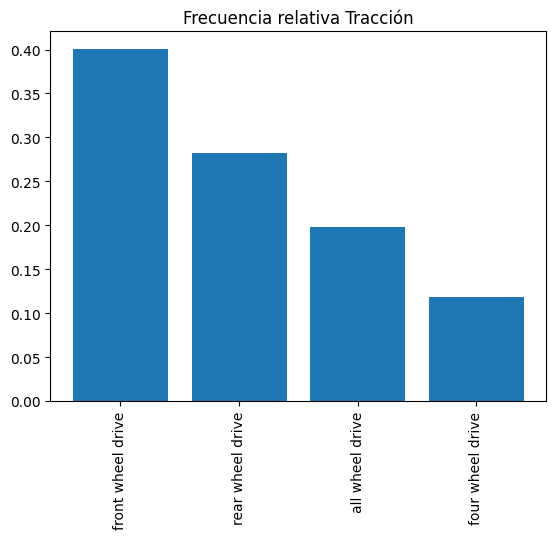

########### Para  Mercado ###########
                       count
Mercado                     
Crossover           0.093380
Flex Fuel           0.073823
Luxury              0.072045
Luxury,Performance  0.056976
Hatchback           0.051981


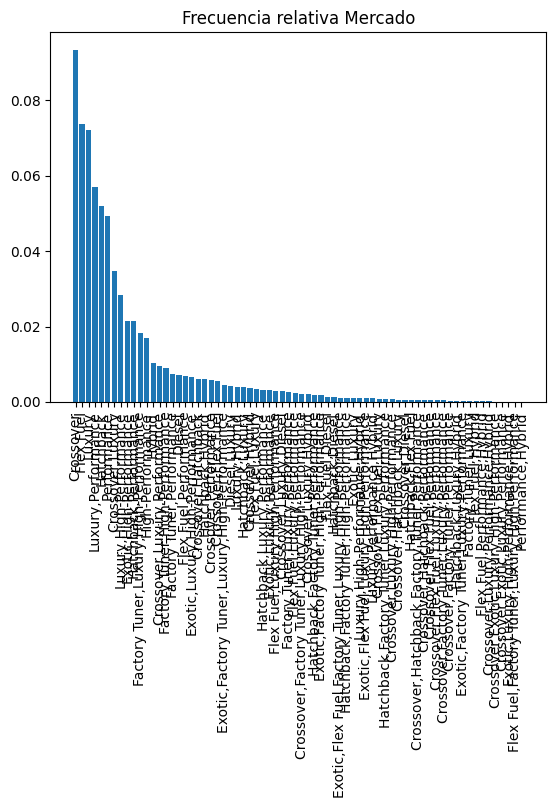

########### Para  Estilo ###########
                    count
Estilo                   
Sedan            0.255080
4dr SUV          0.209956
Coupe            0.100745
Convertible      0.067135
Crew Cab Pickup  0.057653


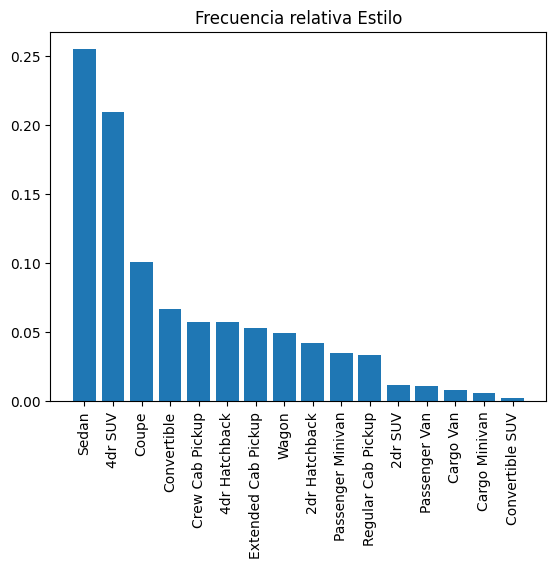

In [7]:
for i in ['Marca', 'Modelo', 'Combustible', 'Transmisión', 'Tracción', 'Mercado', 'Estilo']:
    print('########### Para ', i, '###########')
    df = pd.DataFrame(coches_red[i].value_counts()/len(coches_red[i]))
    print(df.head())
    plt.bar(x=df.index, height=df['count'])
    title = 'Frecuencia relativa ' + i
    plt.title(title)
    plt.xticks(rotation=90)
    plt.show()



Hay varias variables que tienen demasiadas categorías como para representarlas en un gráfico, sin embargo, en todos los casos podemos ver aquellos valores más prominentes.

Para las variables de Transmisión y Combustible hay valores que se dan muy poco (y en el caso de Transmisión uno de esos valores corresponde a NaN). Eliminaremos estos registros.

In [8]:
coches_red = coches_red[~((coches_red['Transmisión'] == 'UNKNOWN') | (coches_red['Transmisión'] == 'DIRECT_DRIVE'))]
coches_red = coches_red[~((coches_red['Combustible'] == 'flex-fuel (premium unleaded required/E85)') | (coches_red['Combustible'] == 'electric') | (coches_red['Combustible'] == 'flex-fuel (premium unleaded recommended/E85)') | (coches_red['Combustible'] == 'natural gas'))]

########### Para  Combustible ###########
                                   count
Combustible                             
regular unleaded                0.609952
premium unleaded (required)     0.170229
premium unleaded (recommended)  0.129873
flex-fuel (unleaded/E85)        0.076864
diesel                          0.013081


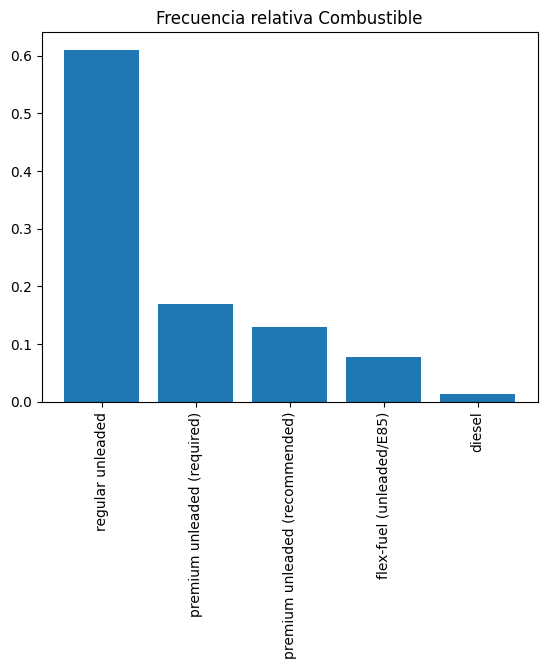

########### Para  Transmisión ###########
                     count
Transmisión               
AUTOMATIC         0.697332
MANUAL            0.249231
AUTOMATED_MANUAL  0.053437


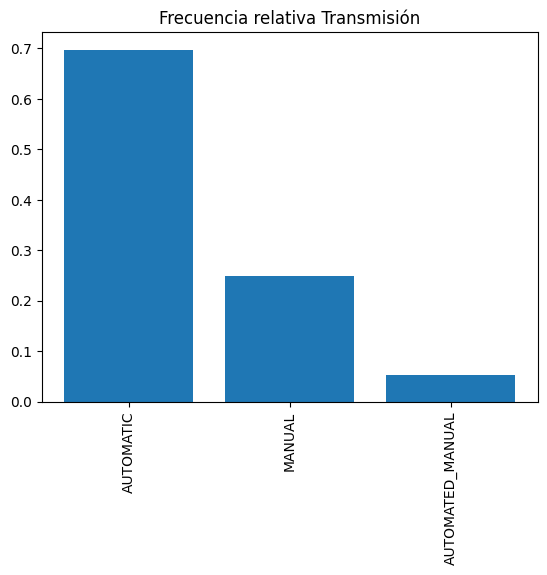

In [9]:
for i in ['Combustible', 'Transmisión']:
    print('########### Para ', i, '###########')
    df = pd.DataFrame(coches_red[i].value_counts()/len(coches_red[i]))
    print(df.head())
    plt.bar(x=df.index, height=df['count'])
    title = 'Frecuencia relativa ' + i
    plt.title(title)
    plt.xticks(rotation=90)
    plt.show()

Pasemos ahora a analizar las variables ordinales.

########### Para  Año ###########
La moda es 2016
La mediana es 2015.0
El máximo es 2017
El mínimo es 1990
El percentil 25% es 2007.0
El percentil 75% es 2016.0


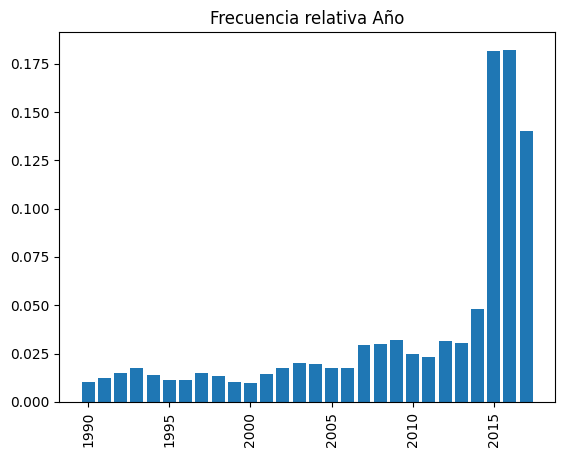

########### Para  Tamaño ###########
La moda es 1
La mediana es 2.0
El máximo es 3
El mínimo es 1
El percentil 25% es 1.0
El percentil 75% es 2.0


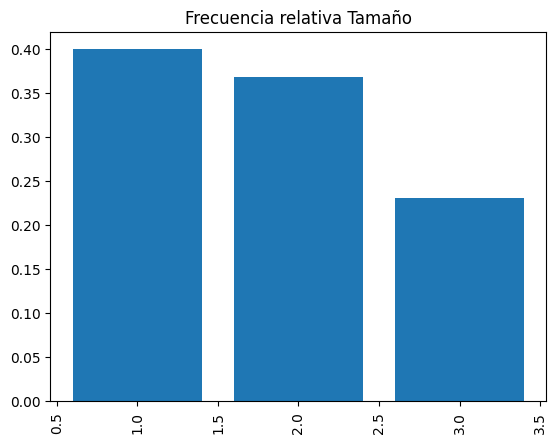

########### Para  Puertas ###########
La moda es 4.0
La mediana es 4.0
El máximo es 4.0
El mínimo es 2.0
El percentil 25% es 2.0
El percentil 75% es 4.0


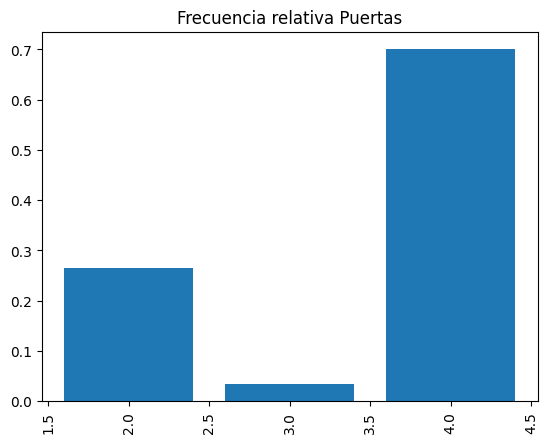

In [10]:
for i in ['Año', 'Tamaño', 'Puertas']:
    df = pd.DataFrame(coches_red.groupby(by=i)['Precio'].count()/len(coches_red[i]))
    print('########### Para ', i, '###########')
    print('La moda es', coches_red[i].mode()[0])
    print('La mediana es',coches_red[i].median())
    print('El máximo es', max(coches_red[i]))
    print('El mínimo es', min(coches_red[i]))
    print('El percentil 25% es', coches_red[i].quantile(0.25))
    print('El percentil 75% es', coches_red[i].quantile(0.75))
    plt.bar(x=df.index, height=df['Precio'])
    title = 'Frecuencia relativa ' + i
    plt.title(title)
    plt.xticks(rotation=90)
    plt.show()

Podemos observar como la mayoría de coches se vendieron en los últimos años del estudio, siendo la mayoría coches con 4 puertas.

Por último analizaremos las variables ratio

########### Para  CV ###########
La moda es 200.0
La media es 248.4764021887825
El máximo es 1001.0
El mínimo es 55.0
El percentil 25% es 170.0
El percentil 75% es 300.0
El rango es 946.0
El rango intercuartilico es 130.0
La desviación típica es 107.81129123572349
La varianza es 11623.27451791399
El coeficiente de asimetria es 1.287765153735053
El coeficiente de curtosis es 2.4031404252316473


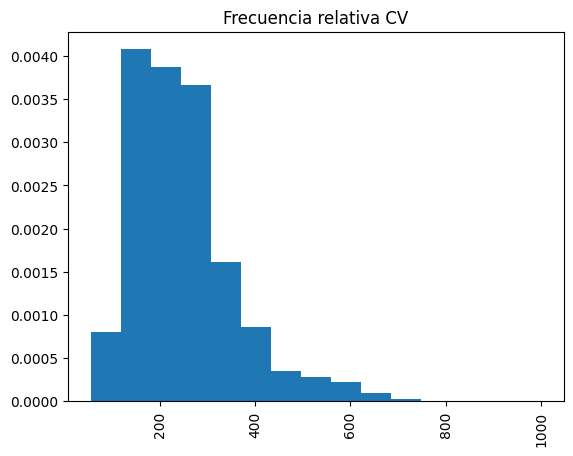

########### Para  Cilindros ###########
La moda es 4.0
La media es 5.639278385772914
El máximo es 16.0
El mínimo es 3.0
El percentil 25% es 4.0
El percentil 75% es 6.0
El rango es 13.0
El rango intercuartilico es 2.0
La desviación típica es 1.720363551404699
La varianza es 2.9596507490017885
El coeficiente de asimetria es 1.1229843362188505
El coeficiente de curtosis es 1.8090646781130775


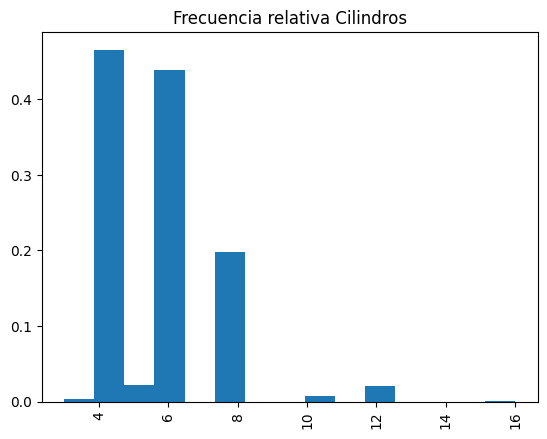

########### Para  Consumo Carretera ###########
La moda es 24.0
La media es 26.271802325581394
El máximo es 354.0
El mínimo es 12.0
El percentil 25% es 22.0
El percentil 75% es 30.0
El rango es 342.0
El rango intercuartilico es 8.0
La desviación típica es 6.9870639672304335
La varianza es 48.81906288216989
El coeficiente de asimetria es 9.207124682059488
El coeficiente de curtosis es 413.17955741088707


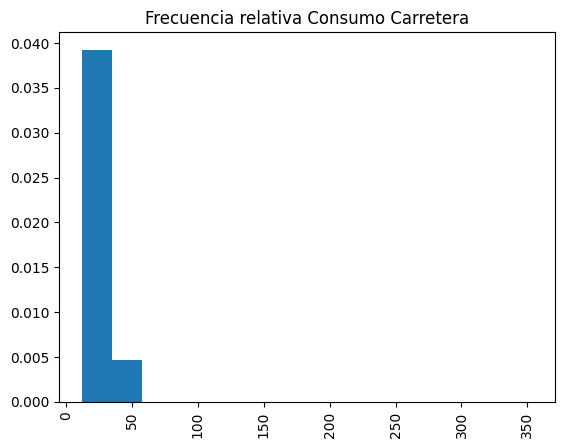

########### Para  Consumo Ciudad ###########
La moda es 17.0
La media es 19.250854993160054
El máximo es 58.0
El mínimo es 7.0
El percentil 25% es 16.0
El percentil 75% es 22.0
El rango es 51.0
El rango intercuartilico es 6.0
La desviación típica es 5.5548413685122116
La varianza es 30.85626262933462
El coeficiente de asimetria es 1.6706539657778257
El coeficiente de curtosis es 5.936681099948089


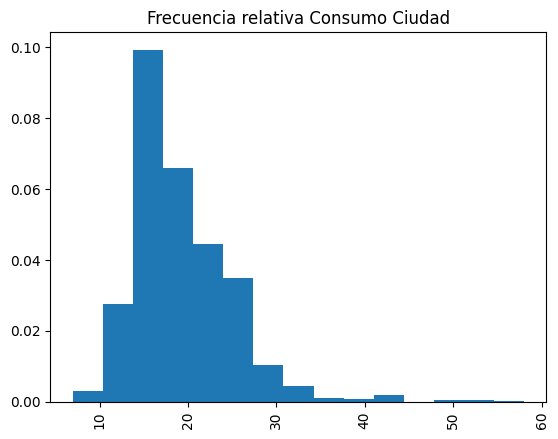

########### Para  Popularidad ###########
La moda es 1385
La media es 1559.890817373461
El máximo es 5657
El mínimo es 2
El percentil 25% es 549.0
El percentil 75% es 2009.0
El rango es 5655
El rango intercuartilico es 1460.0
La desviación típica es 1442.8542005935603
La varianza es 2081828.244170482
El coeficiente de asimetria es 1.6481030917344952
El coeficiente de curtosis es 2.257478098545912


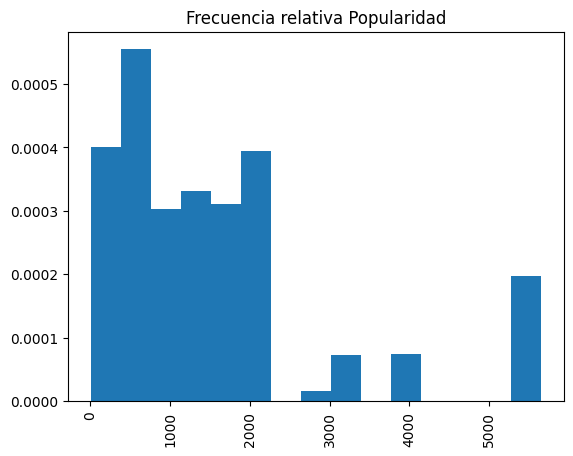

########### Para  Precio ###########
La moda es 2000.0
La media es 40065.1399623803
El máximo es 2065902.0
El mínimo es 2000.0
El percentil 25% es 20960.0
El percentil 75% es 41970.0
El rango es 2063902.0
El rango intercuartilico es 21010.0
La desviación típica es 59829.82352082335
La varianza es 3579607782.5328674
El coeficiente de asimetria es 12.104885297472233
El coeficiente de curtosis es 279.35898783431355


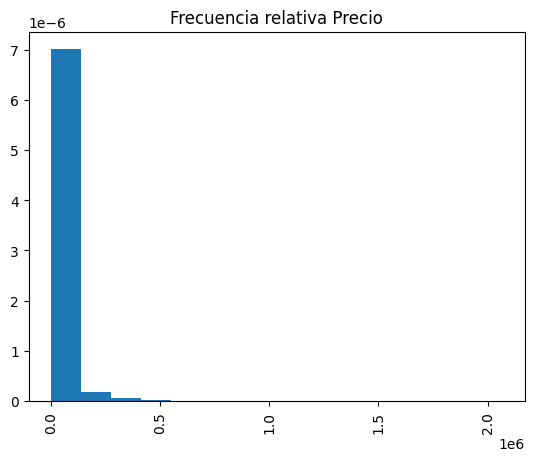

In [11]:
for i in ['CV', 'Cilindros', 'Consumo Carretera', 'Consumo Ciudad', 'Popularidad', 'Precio']:
     print('########### Para ', i, '###########')
     print('La moda es', coches_red[i].mode()[0])
     print('La media es',coches_red[i].mean())
     print('El máximo es', max(coches_red[i]))
     print('El mínimo es', min(coches_red[i]))
     print('El percentil 25% es', coches_red[i].quantile(0.25))
     print('El percentil 75% es', coches_red[i].quantile(0.75))
     print('El rango es', max(coches_red[i]) - min(coches_red[i]))
     print('El rango intercuartilico es', coches_red[i].quantile(0.75) - coches_red[i].quantile(0.25))
     print('La desviación típica es', coches_red[i].std())
     print('La varianza es', coches_red[i].var())
     print('El coeficiente de asimetria es', coches_red[i].skew())
     print('El coeficiente de curtosis es', coches_red[i].kurtosis())
     plt.hist(coches_red[i], bins=15, density=True)
     title = 'Frecuencia relativa ' + i
     plt.title(title)
     plt.xticks(rotation=90)
     plt.show()

Observamos como las variables de consumo en ciudad y carretera así como Precio no se ven bien representadas debido a sus outliers. Es por ello por lo que tienen un alto coeficiente de curtosis. 

Eliminaremos los outliers de estas variables.

Debemos tener en cuenta que nuestro modelo predictor no funcionará muy bien con coches de alto valor, quizá convendría establecer otro modelo para estos casos concretos.

In [12]:
for i in ['Consumo Carretera', 'Consumo Ciudad', 'Precio']:
    IQR = coches_red[i].quantile(0.75) - coches_red[i].quantile(0.25)
    cond_1 = coches_red[i] < (coches_red[i].quantile(0.75) + 1.5 * IQR)
    cond_2 = coches_red[i] > (coches_red[i].quantile(0.25) - 1.5 * IQR)

    coches_red = coches_red[cond_1 & cond_2]

coches_red

,Marca,Modelo,Año,Combustible,CV,Cilindros,Transmisión,Tracción,Puertas,Mercado,Tamaño,Estilo,Consumo Carretera,Consumo Ciudad,Popularidad,Precio
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",1,Coupe,26.0,19.0,3916,46135.0
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",1,Convertible,28.0,19.0,3916,40650.0
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",1,Coupe,28.0,20.0,3916,36350.0
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",1,Coupe,28.0,18.0,3916,29450.0
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,1,Convertible,28.0,18.0,3916,34500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11909,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",2,4dr Hatchback,23.0,16.0,204,46120.0
11910,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",2,4dr Hatchback,23.0,16.0,204,56670.0
11911,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",2,4dr Hatchback,23.0,16.0,204,50620.0
11912,Acura,ZDX,2013,premium unleaded (recommended),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",2,4dr Hatchback,23.0,16.0,204,50920.0


########### Para  Consumo Carretera ###########
La moda es 24.0
La media es 26.15292758089368
El máximo es 41.0
El mínimo es 12.0
El percentil 25% es 22.0
El percentil 75% es 30.0
El rango es 29.0
El rango intercuartilico es 8.0
La desviación típica es 5.626357111548855
La varianza es 31.655894346676376
El coeficiente de asimetria es 0.21278585461837965
El coeficiente de curtosis es -0.5090297758147662


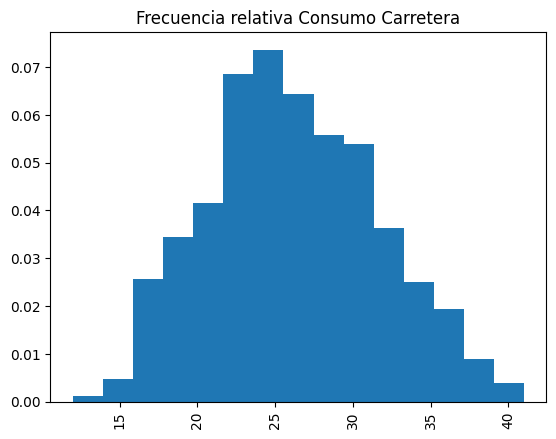

########### Para  Consumo Ciudad ###########
La moda es 17.0
La media es 19.043624807395993
El máximo es 30.0
El mínimo es 10.0
El percentil 25% es 16.0
El percentil 75% es 22.0
El rango es 20.0
El rango intercuartilico es 6.0
La desviación típica es 4.228374659901227
La varianza es 17.879152264494813
El coeficiente de asimetria es 0.45452628176750265
El coeficiente de curtosis es -0.40566065353274494


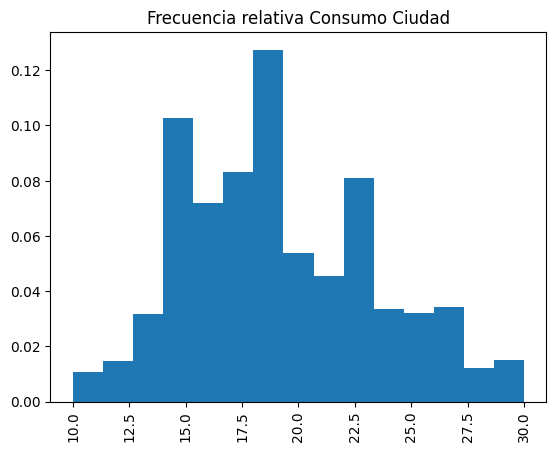

########### Para  Precio ###########
La moda es 2000.0
La media es 28797.054218027733
El máximo es 74700.0
El mínimo es 2000.0
El percentil 25% es 20048.75
El percentil 75% es 38586.25
El rango es 72700.0
El rango intercuartilico es 18537.5
La desviación típica es 16179.355718444947
La varianza es 261771551.46397722
El coeficiente de asimetria es 0.134669911586312
El coeficiente de curtosis es -0.1782322652127486


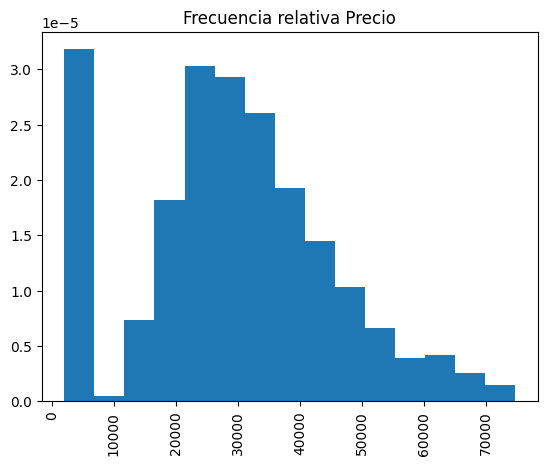

In [13]:
for i in ['Consumo Carretera', 'Consumo Ciudad', 'Precio']:
     print('########### Para ', i, '###########')
     print('La moda es', coches_red[i].mode()[0])
     print('La media es',coches_red[i].mean())
     print('El máximo es', max(coches_red[i]))
     print('El mínimo es', min(coches_red[i]))
     print('El percentil 25% es', coches_red[i].quantile(0.25))
     print('El percentil 75% es', coches_red[i].quantile(0.75))
     print('El rango es', max(coches_red[i]) - min(coches_red[i]))
     print('El rango intercuartilico es', coches_red[i].quantile(0.75) - coches_red[i].quantile(0.25))
     print('La desviación típica es', coches_red[i].std())
     print('La varianza es', coches_red[i].var())
     print('El coeficiente de asimetria es', coches_red[i].skew())
     print('El coeficiente de curtosis es', coches_red[i].kurtosis())
     plt.hist(coches_red[i], bins=15, density=True)
     title = 'Frecuencia relativa ' + i
     plt.title(title)
     plt.xticks(rotation=90)
     plt.show()

Parece que para el precio hay un límite inferior de 2000 euros. Consideraremos estos datos anormales y los eliminaremos.

In [14]:
len(coches_red['Precio'][coches_red['Precio']==2000])

1010

In [15]:
coches_red = coches_red[coches_red['Precio']!=2000]

########### Para  Precio ###########
La moda es 29995.0
La media es 31684.298165137614
El máximo es 74700.0
El mínimo es 2002.0
El percentil 25% es 22899.0
El percentil 75% es 39900.0
El rango es 72698.0
El rango intercuartilico es 17001.0
La desviación típica es 14292.100502660658
La varianza es 204264136.77815303
El coeficiente de asimetria es 0.31241310898004554
El coeficiente de curtosis es 0.3027849130926321


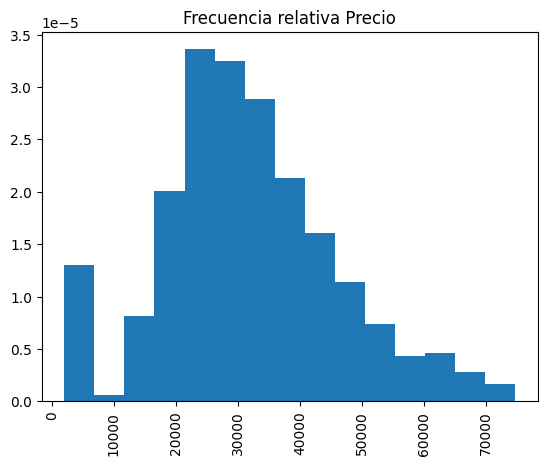

In [16]:
for i in ['Precio']:
     print('########### Para ', i, '###########')
     print('La moda es', coches_red[i].mode()[0])
     print('La media es',coches_red[i].mean())
     print('El máximo es', max(coches_red[i]))
     print('El mínimo es', min(coches_red[i]))
     print('El percentil 25% es', coches_red[i].quantile(0.25))
     print('El percentil 75% es', coches_red[i].quantile(0.75))
     print('El rango es', max(coches_red[i]) - min(coches_red[i]))
     print('El rango intercuartilico es', coches_red[i].quantile(0.75) - coches_red[i].quantile(0.25))
     print('La desviación típica es', coches_red[i].std())
     print('La varianza es', coches_red[i].var())
     print('El coeficiente de asimetria es', coches_red[i].skew())
     print('El coeficiente de curtosis es', coches_red[i].kurtosis())
     plt.hist(coches_red[i], bins=15, density=True)
     title = 'Frecuencia relativa ' + i
     plt.title(title)
     plt.xticks(rotation=90)
     plt.show()

Pese a que sigan habiendo bastantes coches por menos de 10000 euros vamos a dejarlo estar. Estos datos no están concentrados en torno a un único valor como antes, teniendo así mayor sentido que en el caso anterior, donde muchas observaciones tenían un precio exactamente igual a 2000.

(array([174., 112.,  74.,  70.,  56.,  35.,  16.,  13.,  11.,  10.]),
 array([2002. , 2299.4, 2596.8, 2894.2, 3191.6, 3489. , 3786.4, 4083.8,
        4381.2, 4678.6, 4976. ]),
 <BarContainer object of 10 artists>)

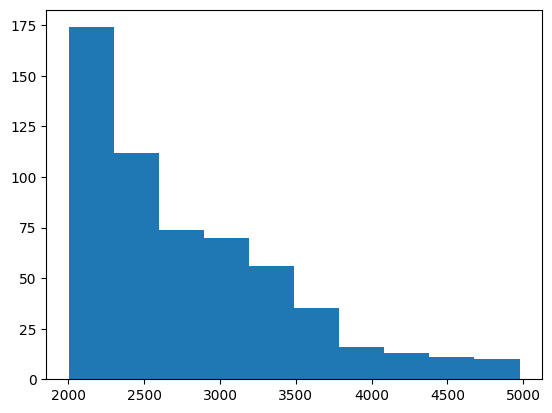

In [17]:
#Aquí podemos ver la cola de la distribución en más detalle

plt.hist(coches_red['Precio'][coches_red['Precio']<5000])

Continuamos con el análisis bivariante, en este caso compararemos cada variable con el precio.

Comenzamos con las variables cualitativas.

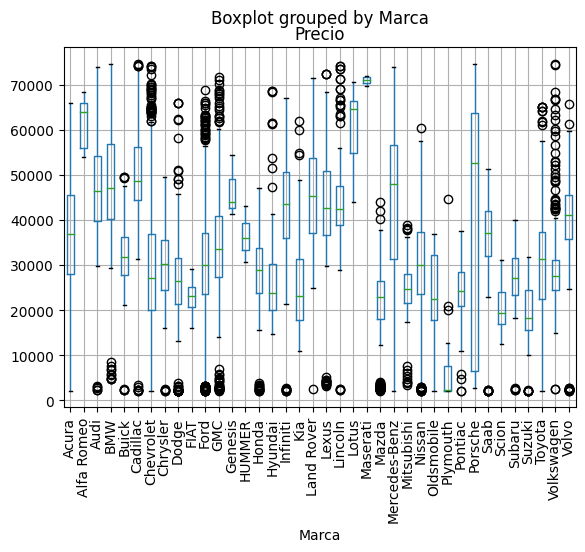

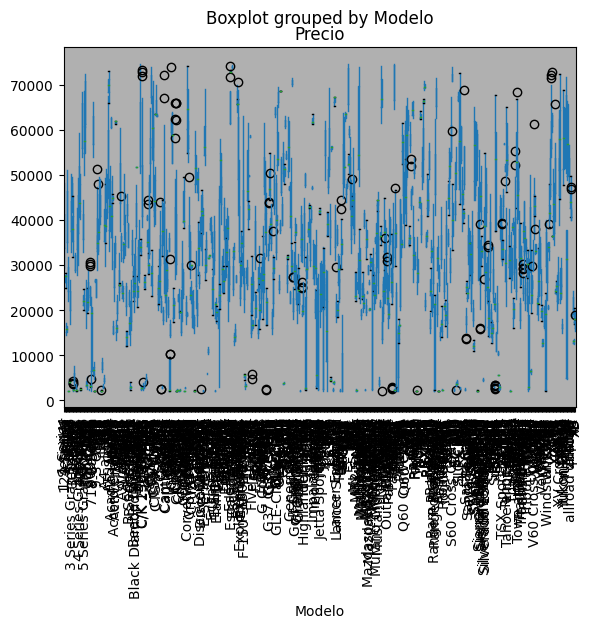

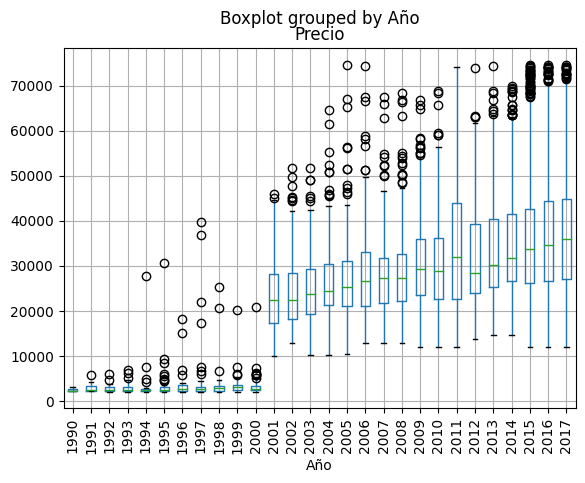

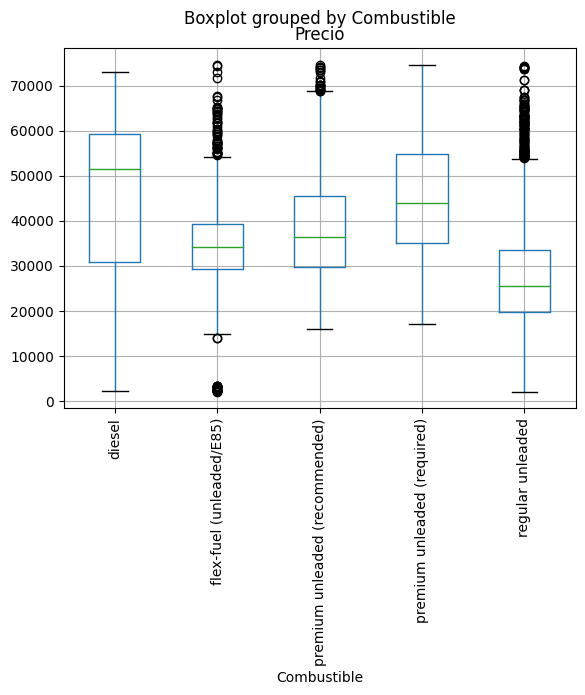

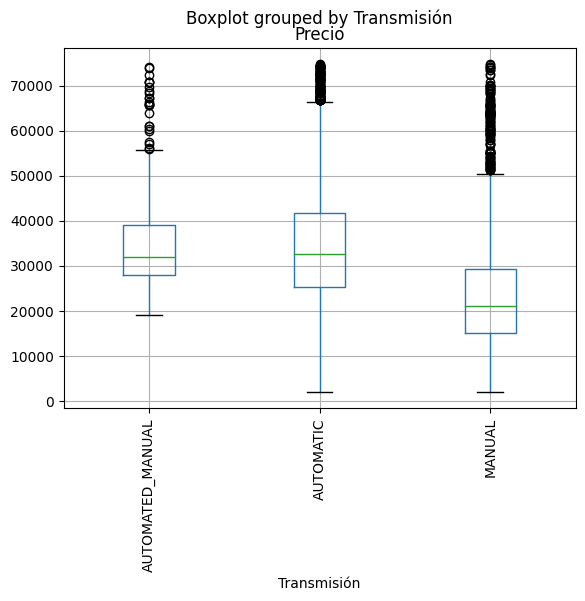

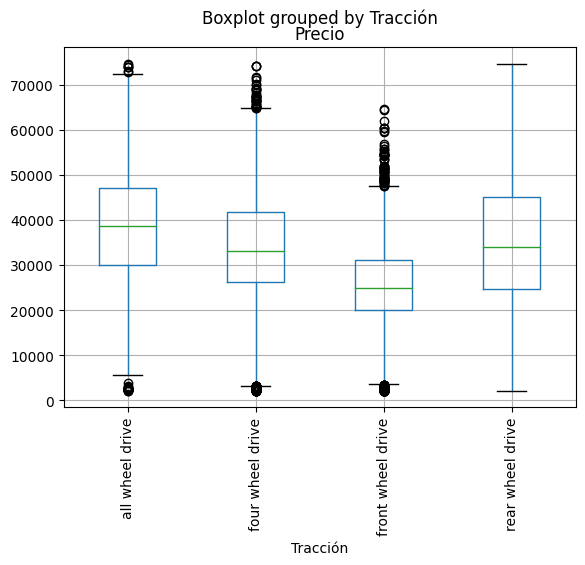

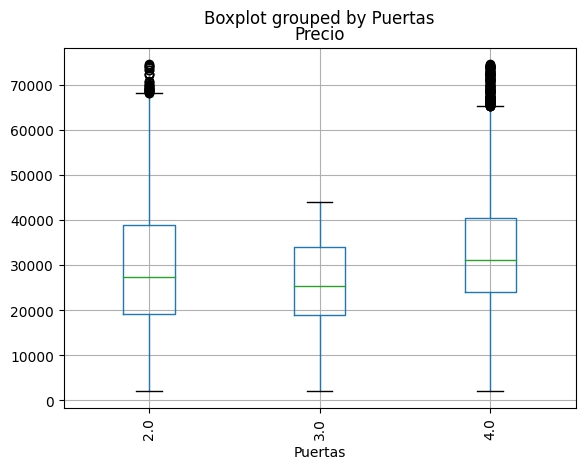

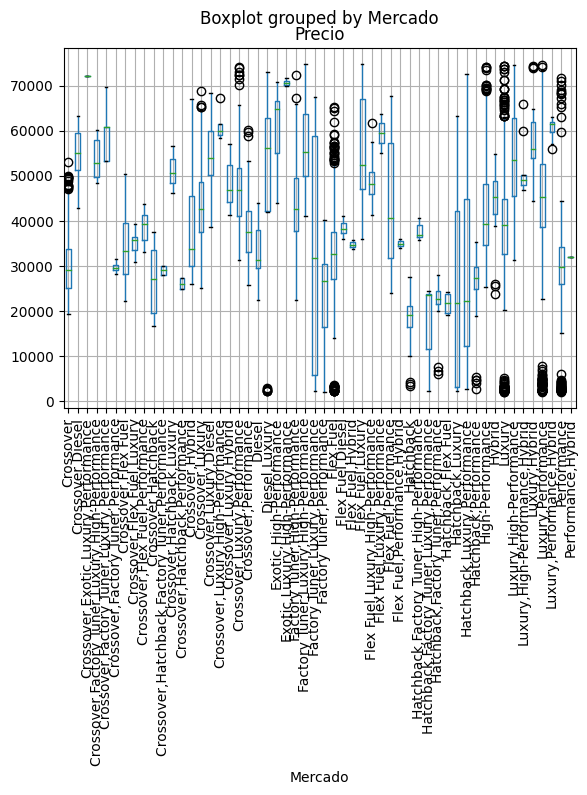

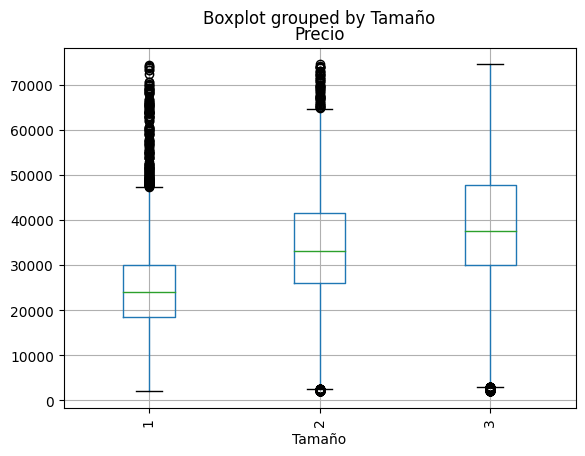

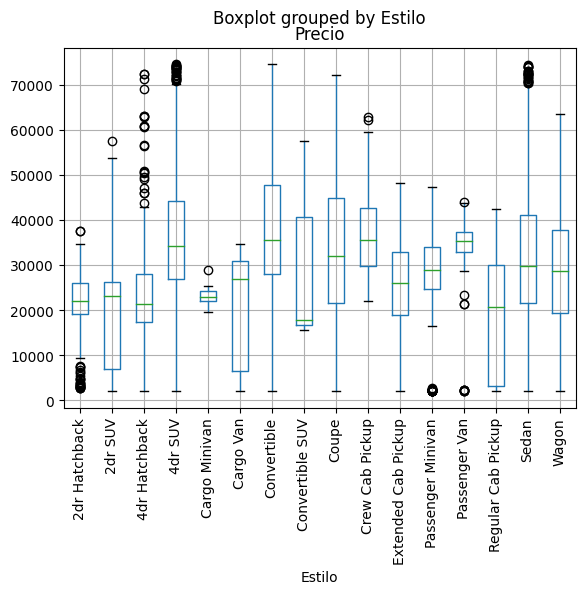

In [18]:
for i in ['Marca', 'Modelo', 'Año', 'Combustible', 'Transmisión', 'Tracción', 'Puertas', 'Mercado', 'Tamaño', 'Estilo']:
    coches_red.boxplot(column=['Precio'], by=i)
    plt.xticks(rotation=90)
    plt.show()

No todas las gráficas aportan información. Al igual que en el análisis univariante, hay variables con muchas categorías, impidiendo sacar conclusiones.

Las conclusiones más importantes que destacar son:
- A mayor tamaño mayor precio
- El número de puertas no interfiere demasiado en el precio
- Los coches automáticos son de media más caros que los manuales
- Los coches con diesel o gasolina premium son más caros
- Con el pasar de los años los precios han subido en gran medida


Contrastaremos ahora las variables cuantitativas.

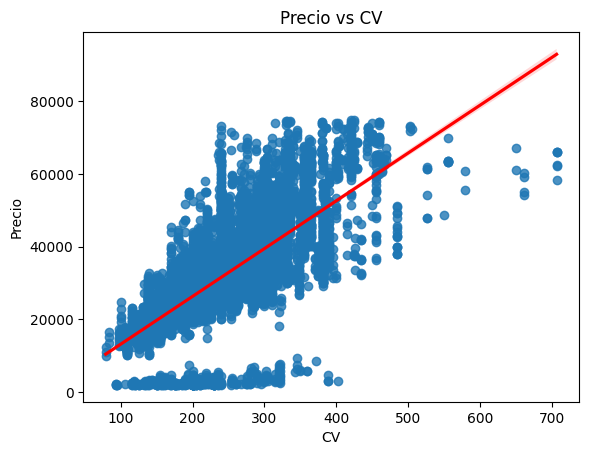

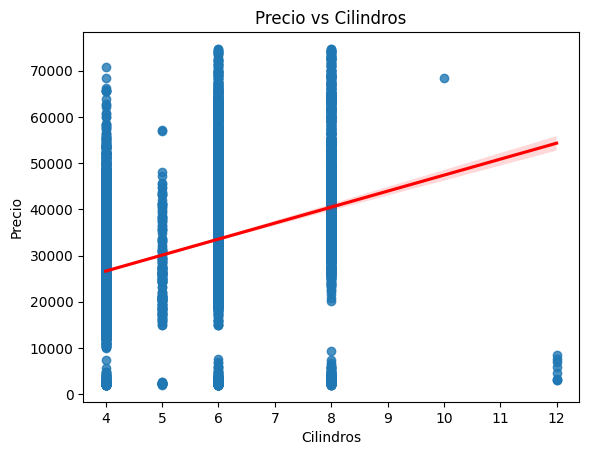

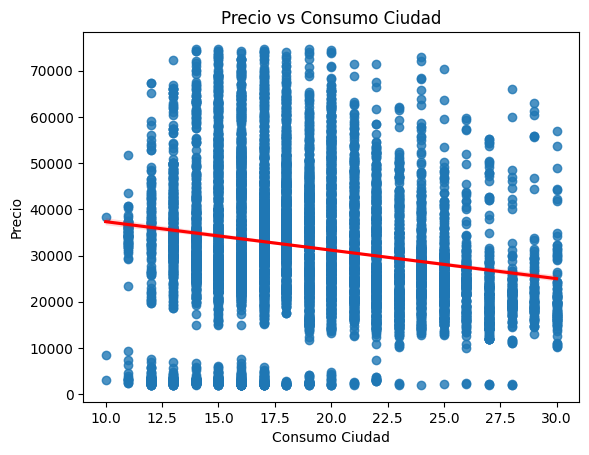

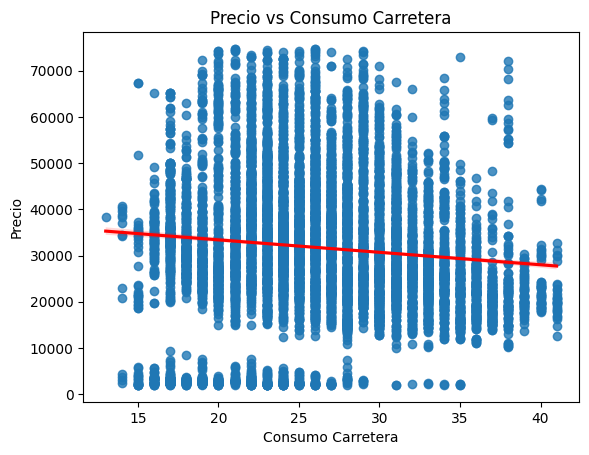

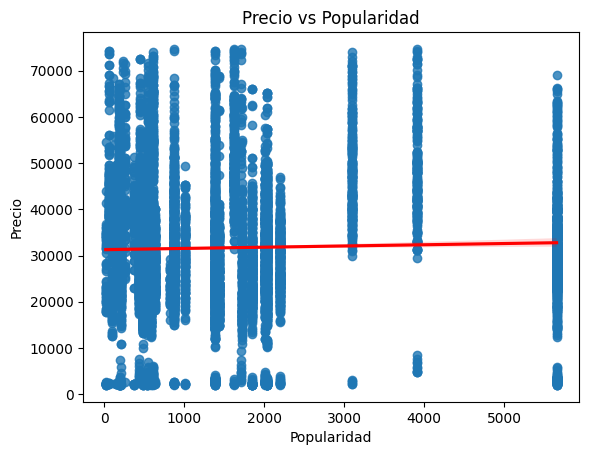

In [19]:
for i in ['CV', 'Cilindros', 'Consumo Ciudad', 'Consumo Carretera', 'Popularidad']:
    sns.regplot(x=coches_red[i], y=coches_red['Precio'], line_kws={"color": "red"})
    titulo = 'Precio vs ' + i
    plt.title(titulo)
    plt.show()
    

A simple vista no sacamos mucha conclusión más allá de que a mayor cilindrada o CV el precio es en general ascendente. Intentaremos hacer uso del Facet Grid.

Comencemos observando CV, que tiene un comportamiento irregular en su parte inferior.

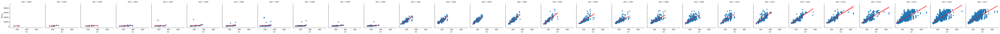

In [20]:
graph = sns.FacetGrid(coches_red, col='Año')
graph.map(sns.regplot, 'CV', 'Precio', line_kws={"color": "red"})
plt.show()

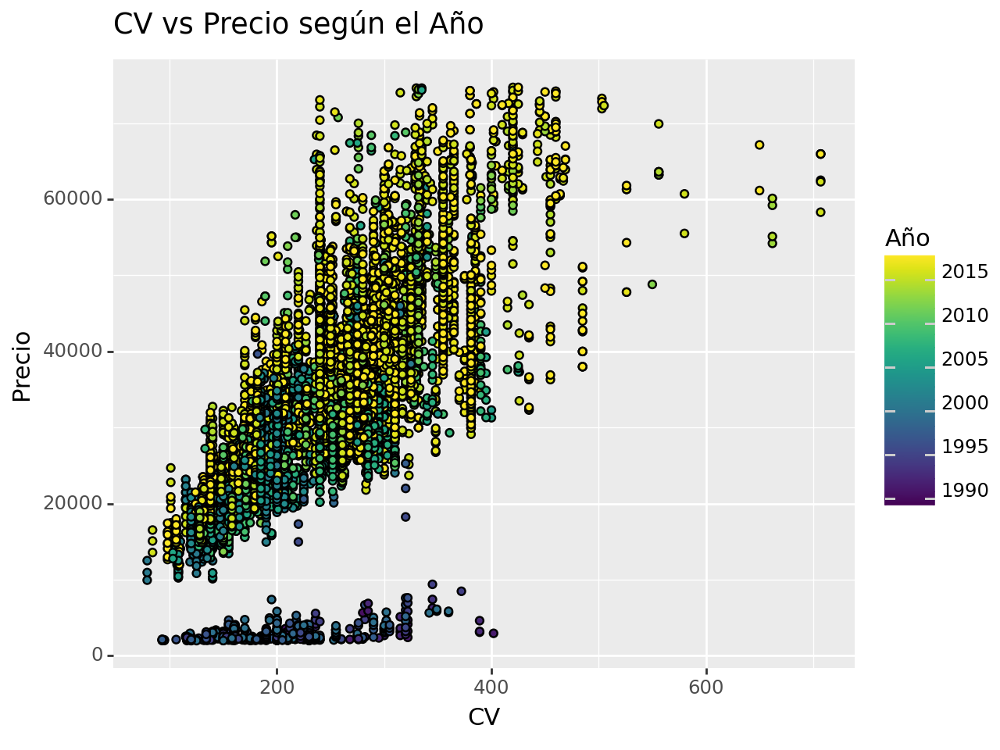

<Figure Size: (640 x 480)>

In [21]:
(
    ggplot(coches_red) +
    geom_point(aes(x='CV', y = 'Precio', fill = 'Año'),
shape='o')
    + labs(title='CV vs Precio según el Año')
)

Observamos como la franja inferior que no encajaba del todo bien con la tendencia ascendente era producto de coches vendidos años atrás, que poseían por ello menor CV.

A continuación el consumo en ciudad y carretera.

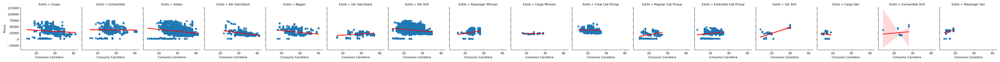

In [22]:
graph = sns.FacetGrid(coches_red, col='Estilo')
graph.map(sns.regplot, 'Consumo Carretera', 'Precio', line_kws={"color": "red"})
plt.show()

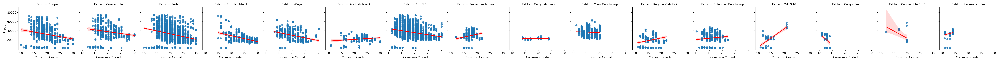

In [23]:
graph = sns.FacetGrid(coches_red, col='Estilo')
graph.map(sns.regplot, 'Consumo Ciudad', 'Precio', line_kws={"color": "red"})
plt.show()

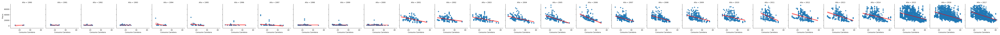

In [24]:
graph = sns.FacetGrid(coches_red, col='Año')
graph.map(sns.regplot, 'Consumo Carretera', 'Precio', line_kws={"color": "red"})
plt.show()

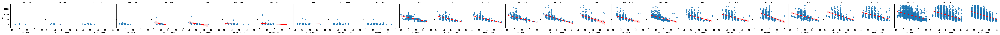

In [25]:
graph = sns.FacetGrid(coches_red, col='Año')
graph.map(sns.regplot, 'Consumo Ciudad', 'Precio', line_kws={"color": "red"})
plt.show()

En ambos consumos se observa como los compradores dan mator importancia a este factor con el paso del tiempo. En los últimos años, la tendencia es mucho mayor inversamente proporcional que al comienzo. En tiempos actuales, un coche que consuma mucho estará peor valorado.

En el caso del consumo de carretera se observa además un efecto curioso, el precio se mantiene más estable si separamos según el estilo del coche. Esto no sucede (en tanta medida) para el consumo en carretera.
Además, los usuarios de coches estilo 2dr SUV prefieren coches con mayor consumo, tanto en ciudad como carretera.

Miraremos ahora los cilindros

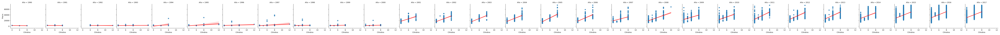

In [26]:
graph = sns.FacetGrid(coches_red, col='Año')
graph.map(sns.regplot, 'Cilindros', 'Precio', line_kws={"color": "red"})
plt.show()

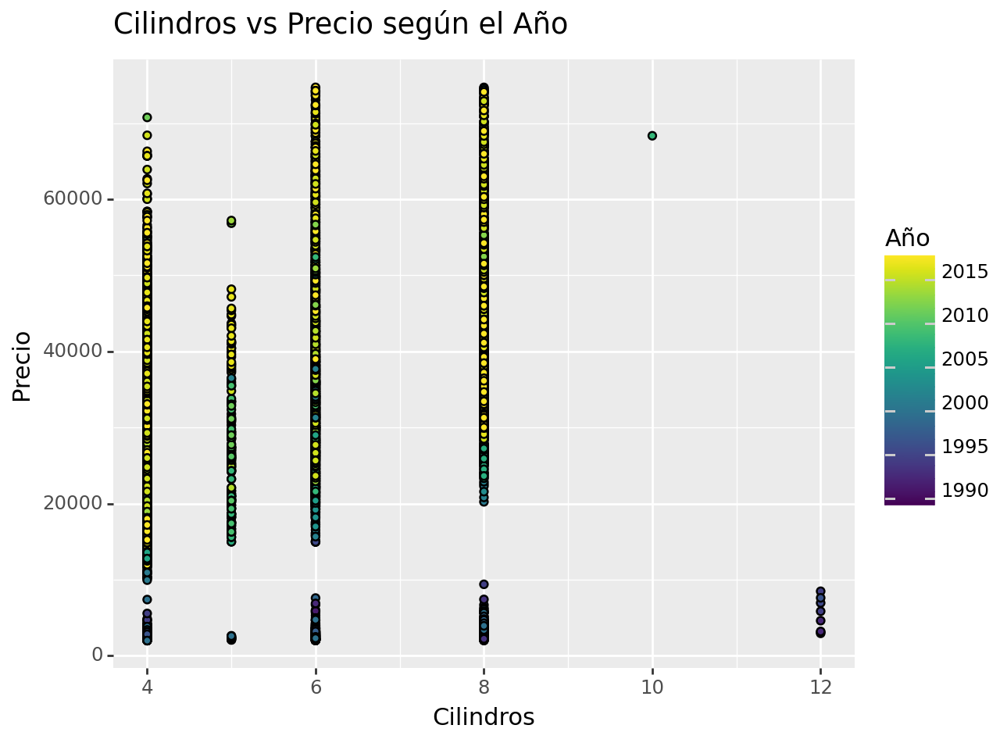

<Figure Size: (640 x 480)>

In [27]:
(
    ggplot(coches_red) +
    geom_point(aes(x='Cilindros', y = 'Precio', fill = 'Año'),
shape='o')
    + labs(title='Cilindros vs Precio según el Año')
)

De nuevo tenemos que la parte que no cuadraba bien con nuestra intuición se debía al comienzo del histórico.

Para evitar que el modelo de regresión 'cargue' con estos datos, eliminaremos los datos anteriores al año 2000.

In [28]:
coches_red = coches_red[coches_red['Año']>2000]
coches_red.shape

(8763, 16)

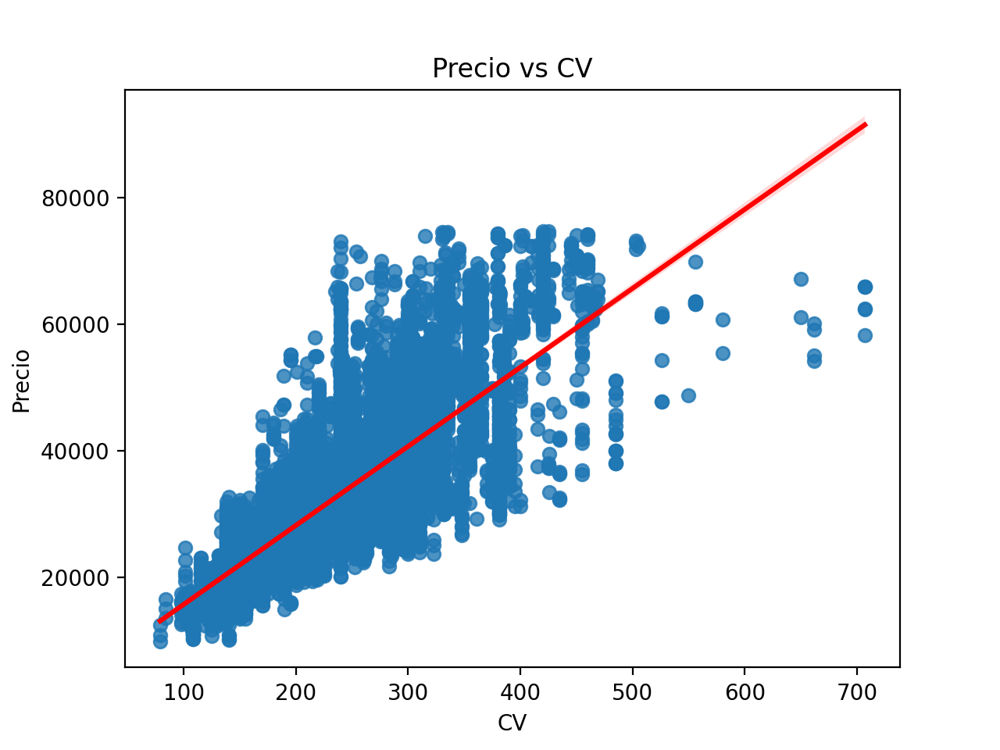

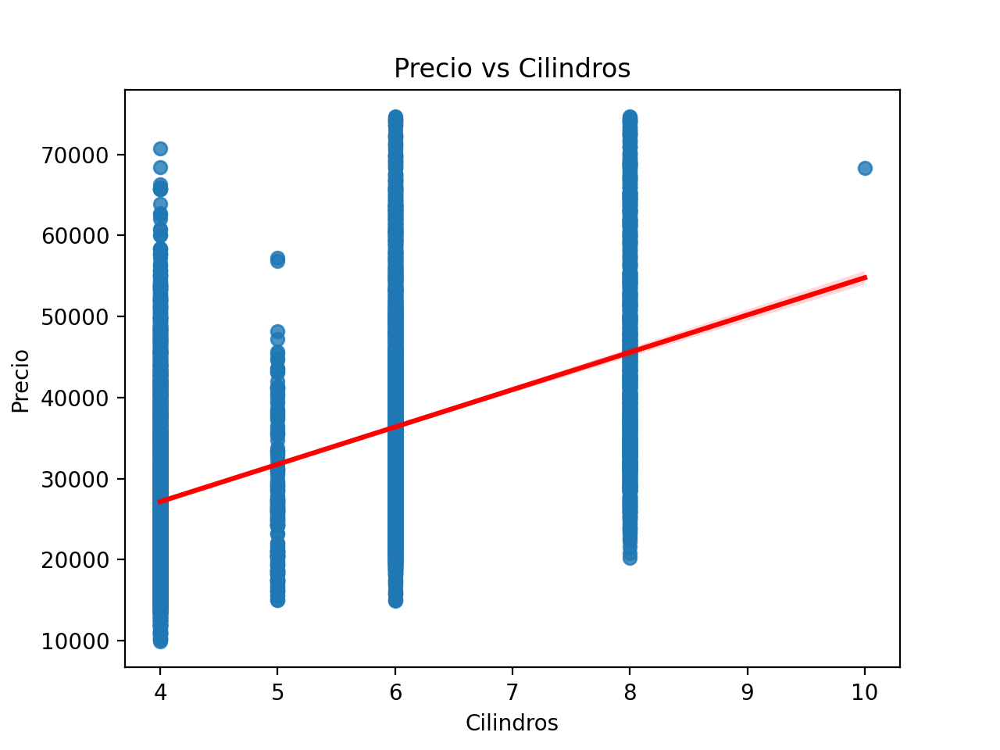

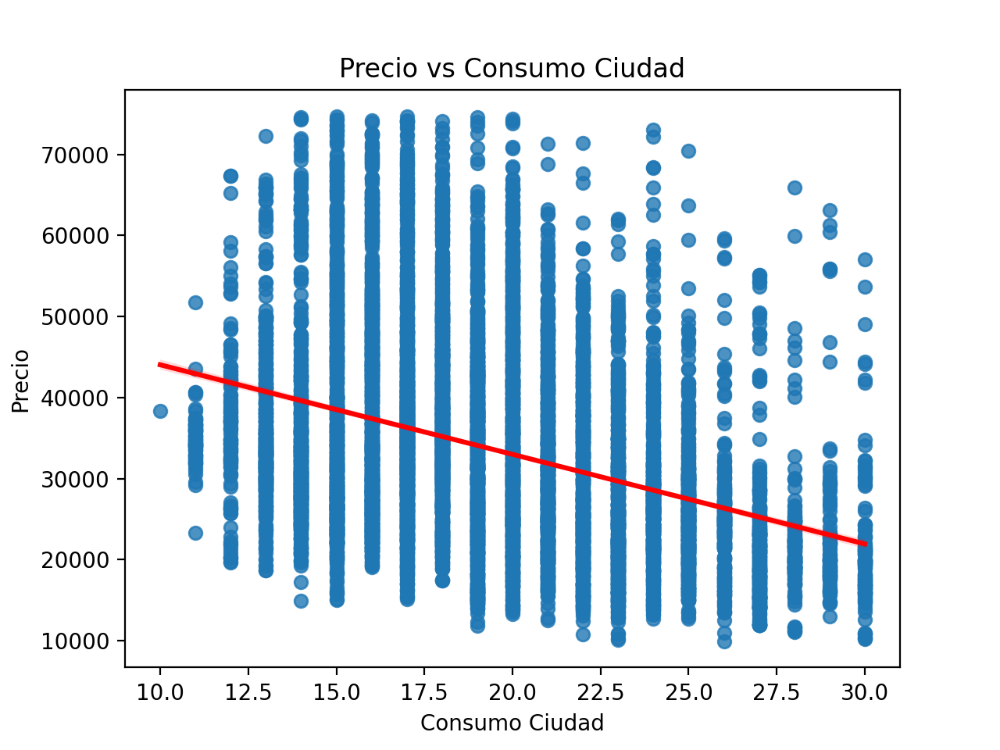

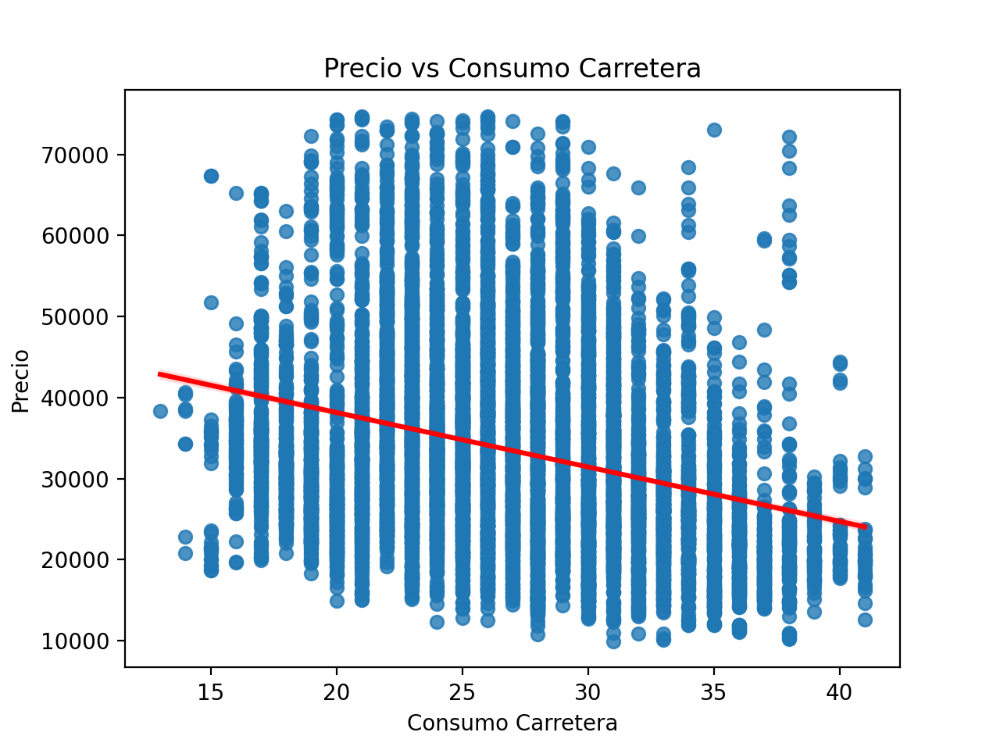

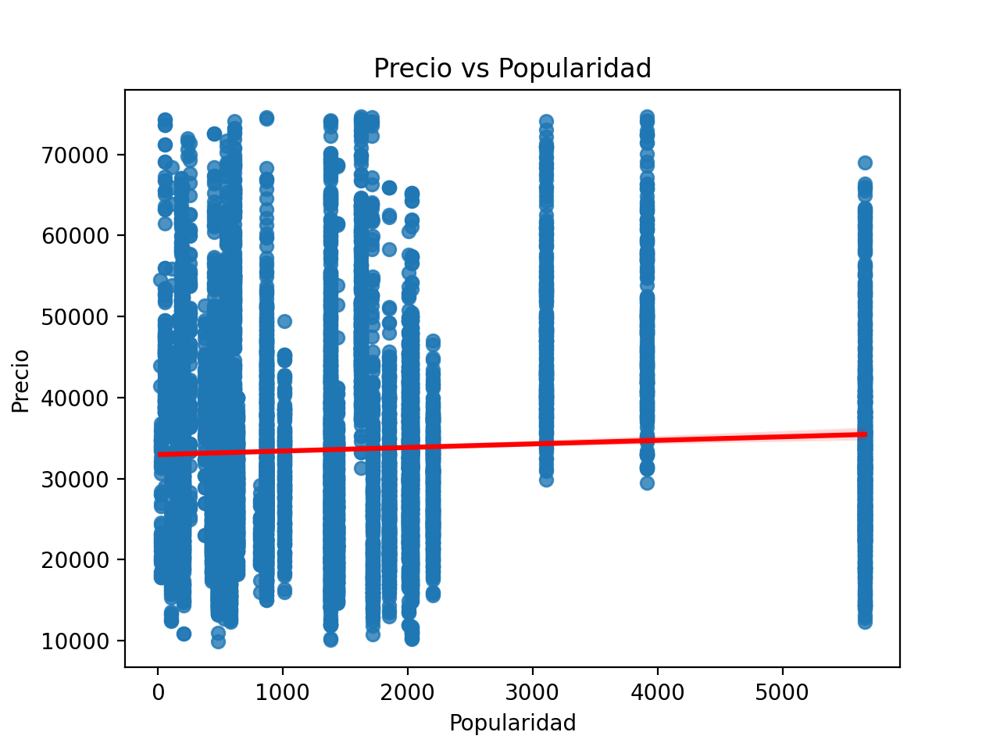

In [29]:
for i in ['CV', 'Cilindros', 'Consumo Ciudad', 'Consumo Carretera', 'Popularidad']:
    sns.regplot(x=coches_red[i], y=coches_red['Precio'], line_kws={"color": "red"})
    titulo = 'Precio vs ' + i
    plt.title(titulo)
    plt.show()
    

Las conclusiones hayadas anteriormente siguen siendo válidas. Y nuestra intución ha sido buena, ya no se diferencian 2 tendencias distintas en cada sccater plot.

Quedaría estudiar la popularidad.

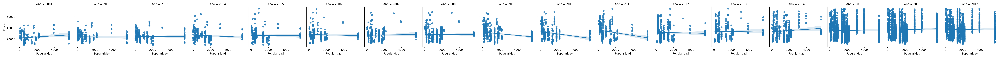

In [30]:
graph = sns.FacetGrid(coches_red, col='Año')
graph.map(sns.regplot, 'Popularidad', 'Precio')
plt.show()

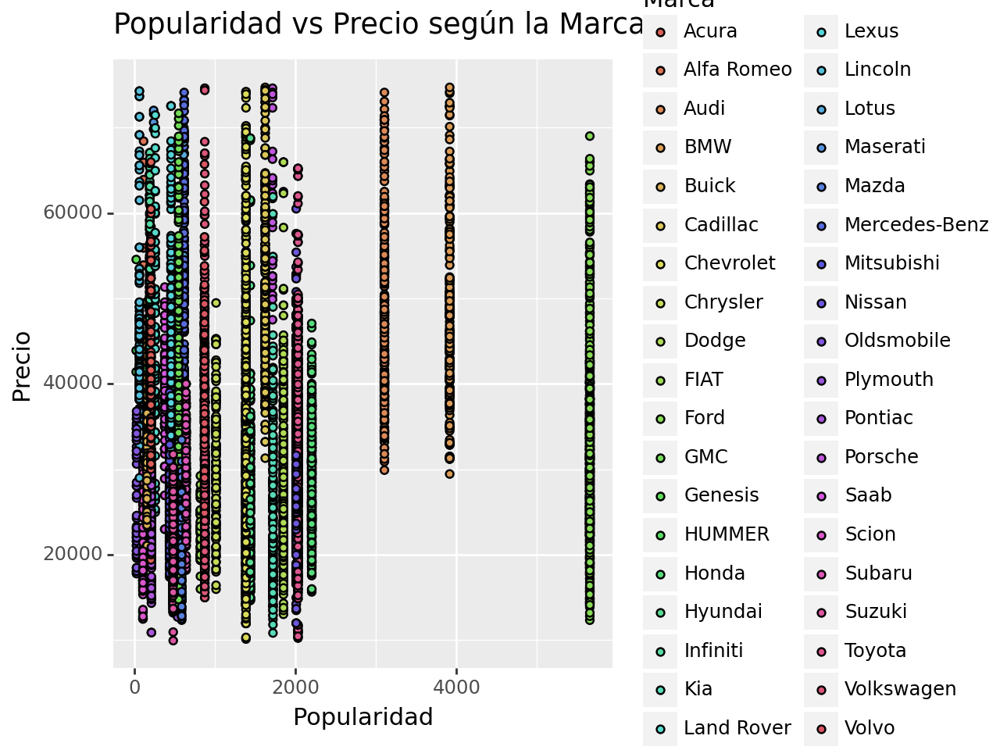

<Figure Size: (640 x 480)>

In [31]:
(
    ggplot(coches_red) +
    geom_point(aes(x='Popularidad', y = 'Precio', fill = 'Marca'),
shape='o')
    + labs(title='Popularidad vs Precio según la Marca')
)

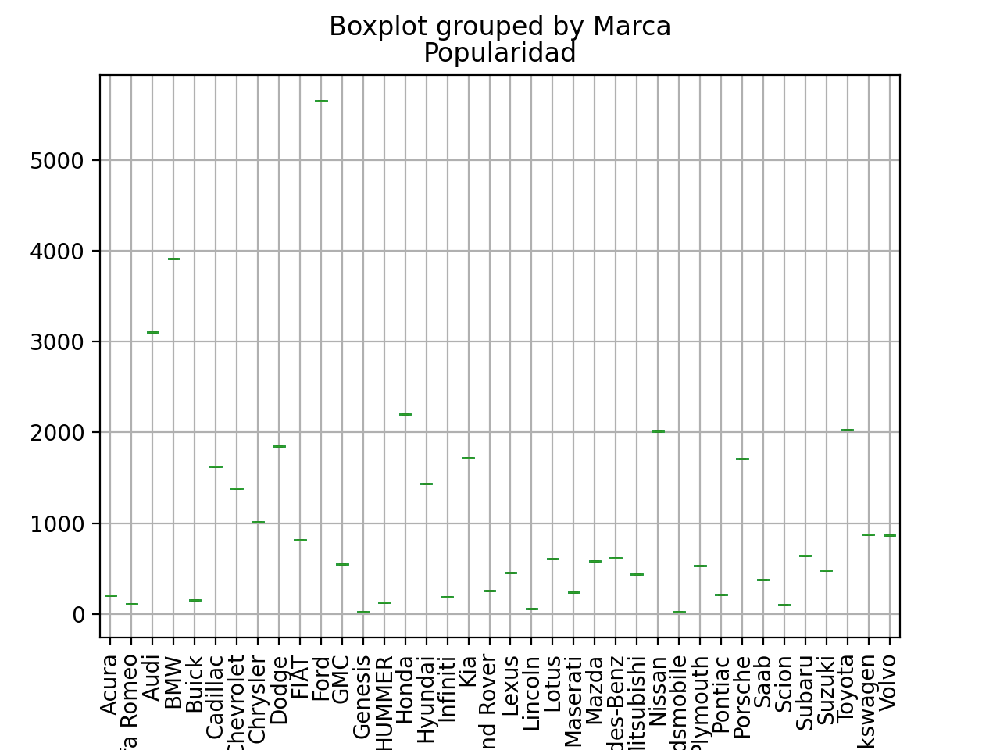

In [32]:
coches_red.boxplot(column=['Popularidad'], by='Marca')
plt.xticks(rotation=90)
plt.show()

Hemos descubierto una relación. Las variables Popularidad y Marca son en verdad la misma. Cada Marca corresponde con un valor de popularidad.

Popularidad es entonces similar a hacer un label encoder de Marca. Yo no le encuentro mucho sentido a hacer algo así por lo que dejaré Marca para luego hacer un OHE y eliminaré Popularidad.

Volveré a hacer el análisis bivariante para las variables categóricas al haber quitado numerosos registros.

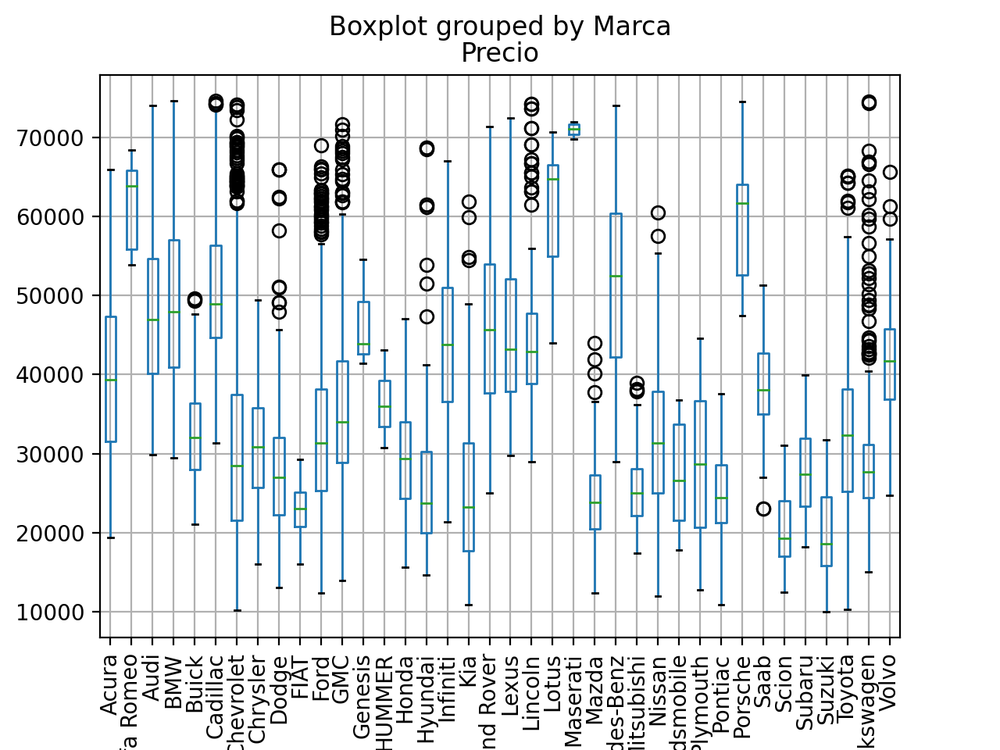

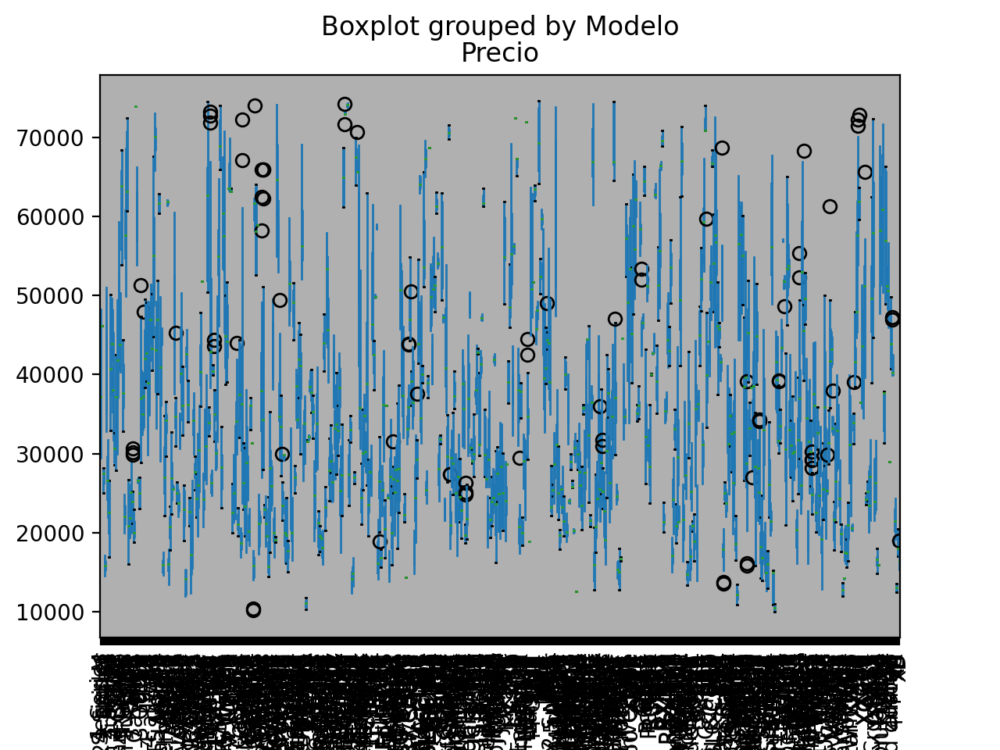

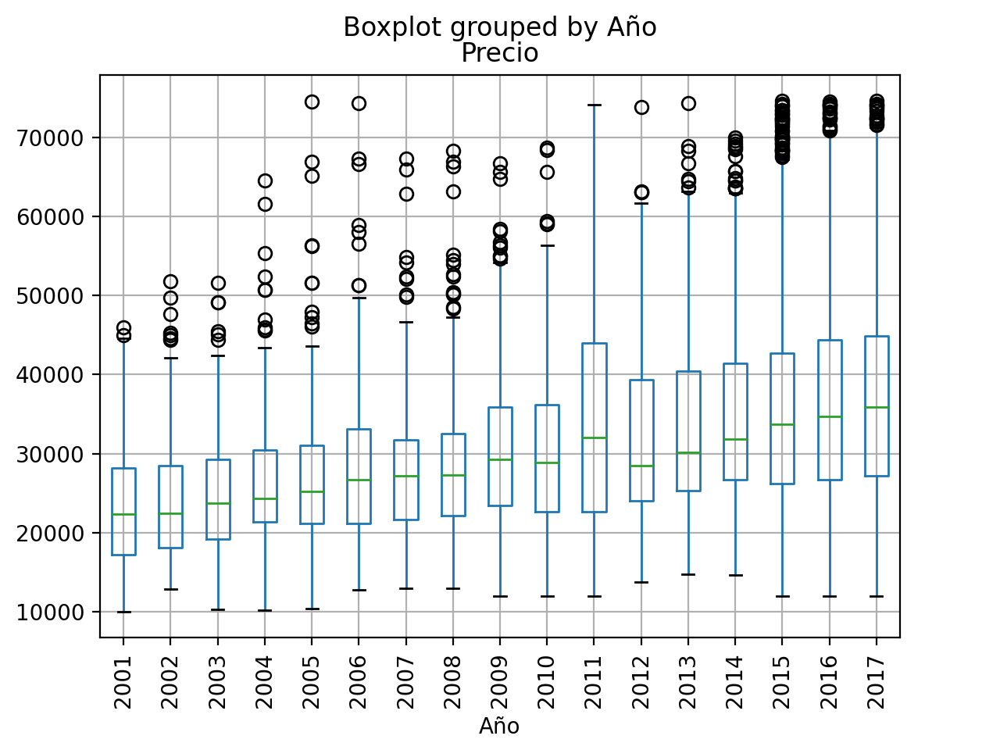

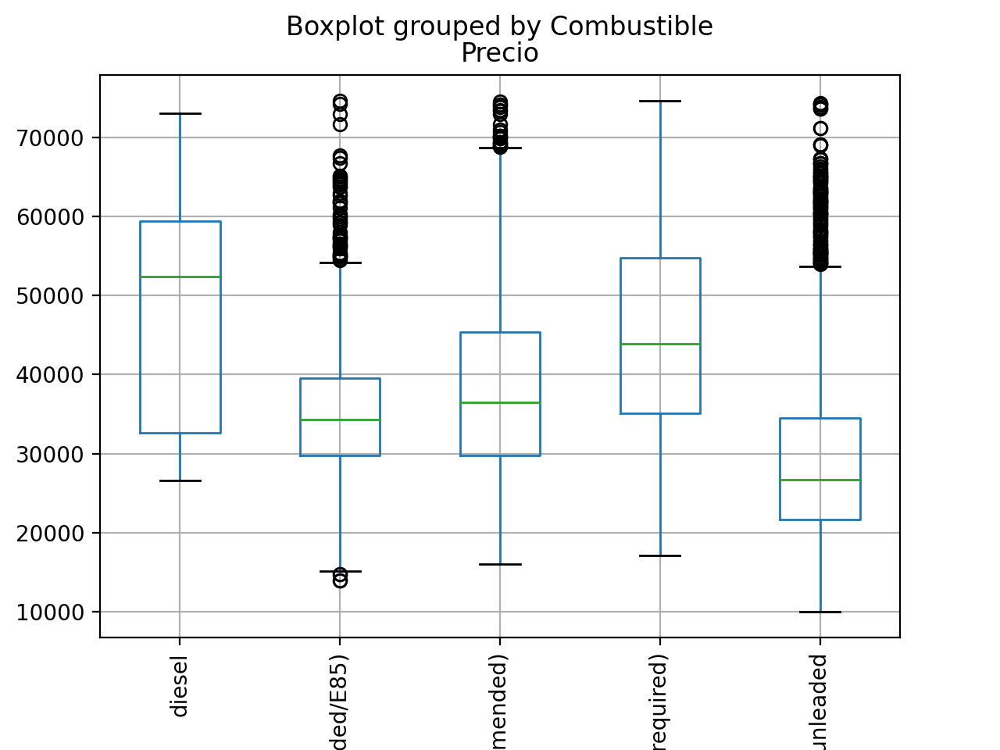

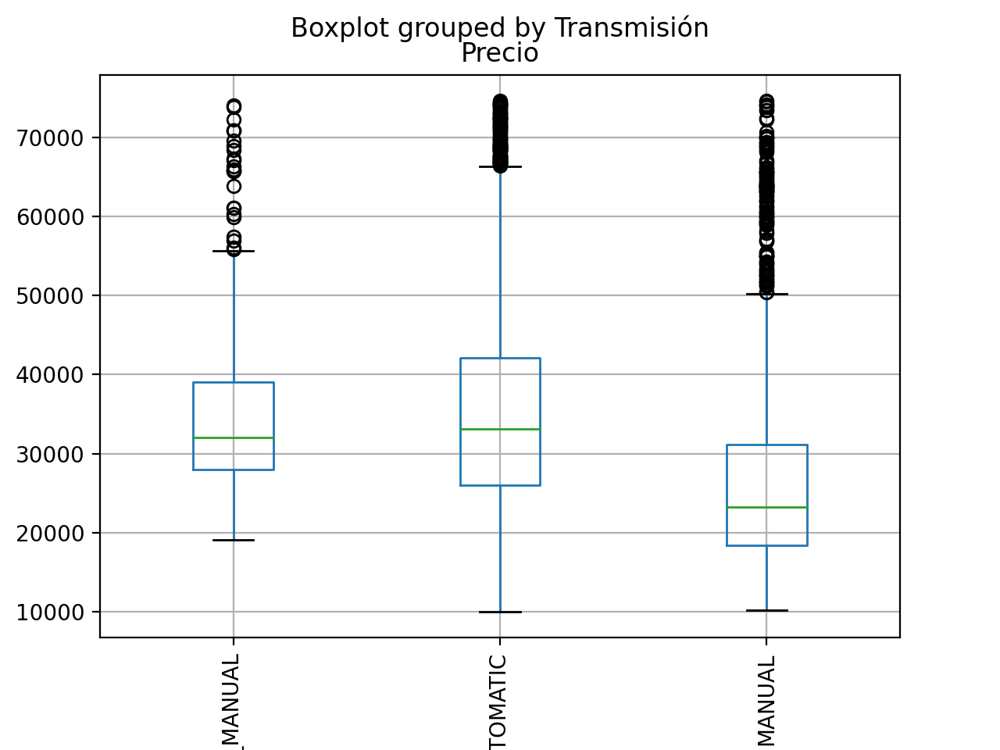

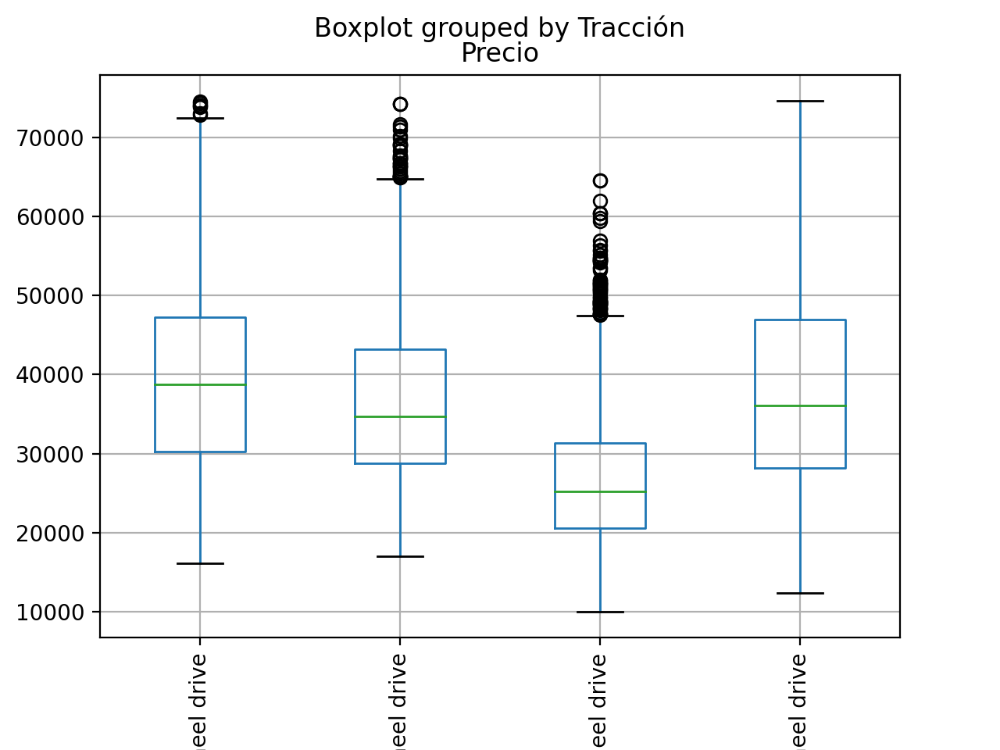

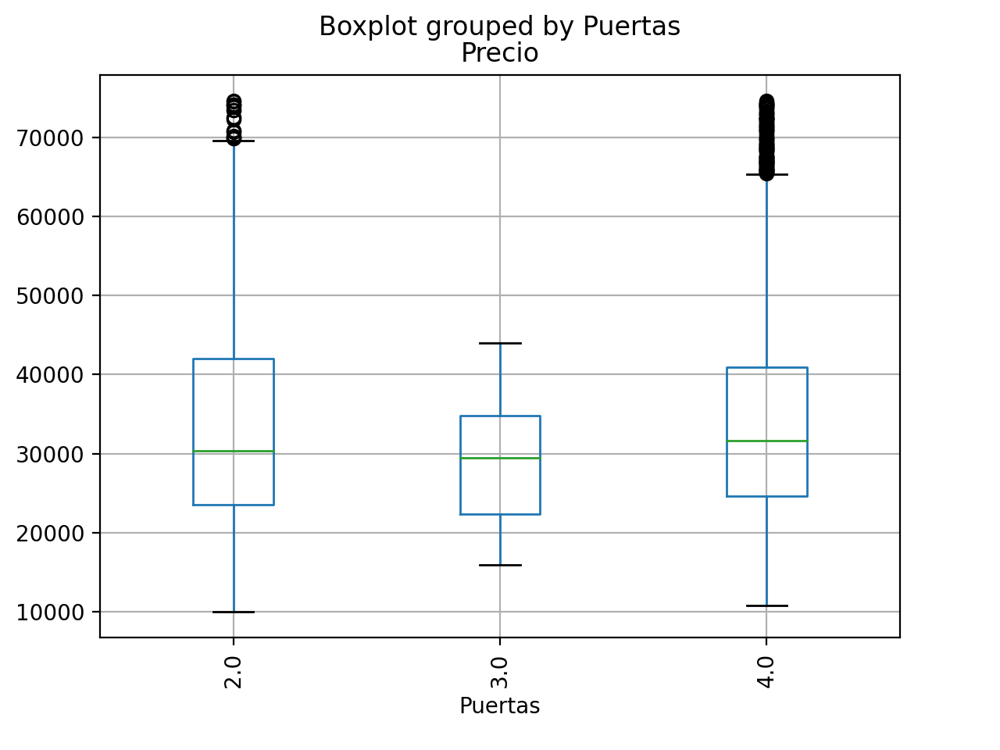

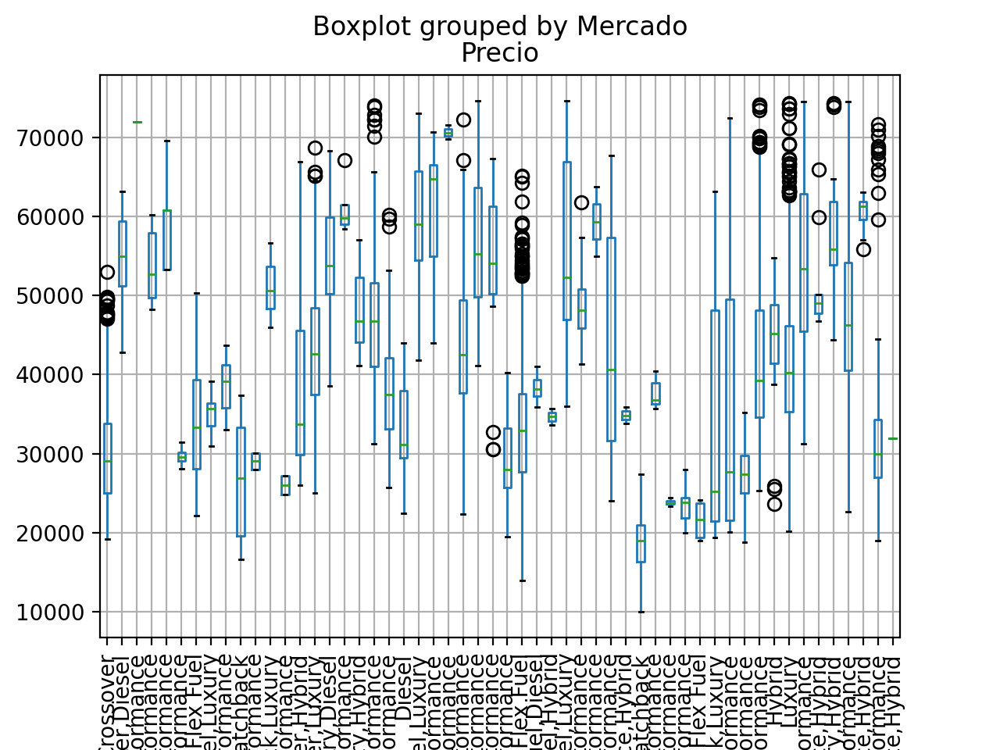

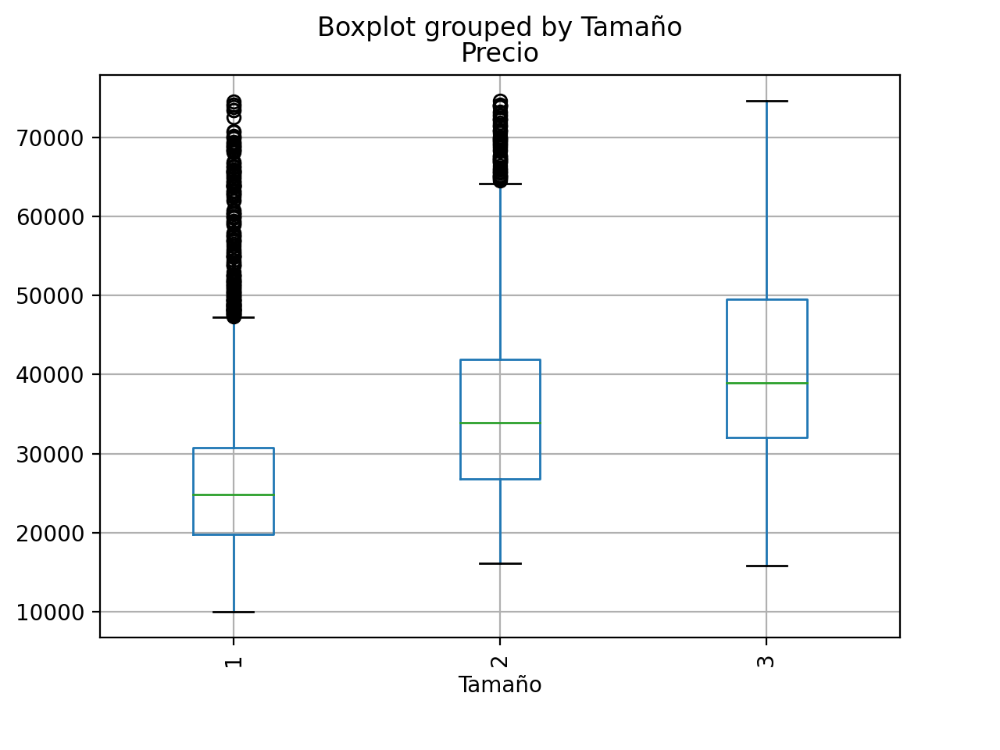

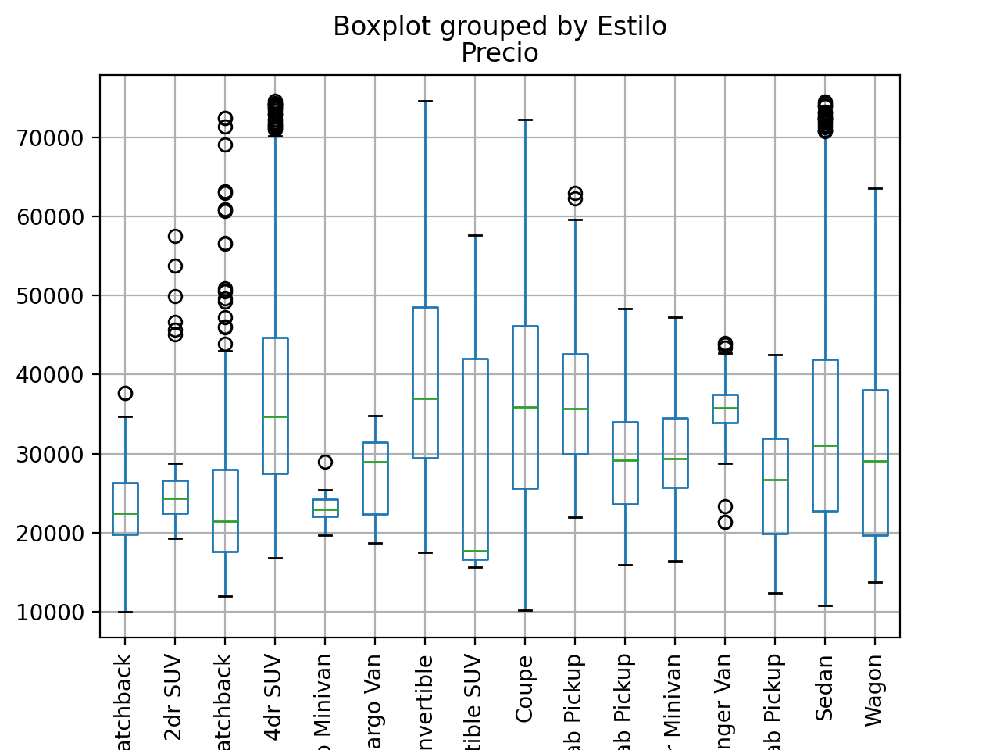

In [33]:
for i in ['Marca', 'Modelo', 'Año', 'Combustible', 'Transmisión', 'Tracción', 'Puertas', 'Mercado', 'Tamaño', 'Estilo']:
    coches_red.boxplot(column=['Precio'], by=i)
    plt.xticks(rotation=90)
    plt.show()

In [34]:
# pip install Jinja2
corr = coches_red[['CV', 'Cilindros', 'Consumo Ciudad', 'Consumo Carretera', 'Popularidad', 'Precio']].corr()
corr.style.background_gradient(cmap='coolwarm')

,CV,Cilindros,Consumo Ciudad,Consumo Carretera,Popularidad,Precio
CV,1.000000,0.754053,-0.603484,-0.512369,0.115835,0.782177
Cilindros,0.754053,1.000000,-0.776643,-0.728458,0.101962,0.510809
Consumo Ciudad,-0.603484,-0.776643,1.000000,0.936667,-0.092299,-0.368839
Consumo Carretera,-0.512369,-0.728458,0.936667,1.000000,-0.087555,-0.295568
Popularidad,0.115835,0.101962,-0.092299,-0.087555,1.000000,0.050504
Precio,0.782177,0.510809,-0.368839,-0.295568,0.050504,1.000000


In [51]:
# Exportar datos tratados a Excel
# coches_red.to_excel(excel_writer='Datos tratados.xlsx')

### 4. Preparación de los datos

Tras todo nuestro análisis considero que las variables que deberíamos desestimar son Modelo; Puertas; Popularidad y Consumo en Carretera (al estar muy relacionada con consumo en ciudad)

La popularidad fue eliminada por nuestro razonamiento anterior, pero aún así podemos ver la baja correlación con los valores de popularidad. Seguramente haciendo un OHE la variable Marca sea de mayor utilidad. 

In [35]:
coches_red_aux = coches_red.drop(columns= ['Puertas', 'Popularidad', 'Consumo Carretera', 'Modelo', 'Mercado'])
coches_red_aux.head()

,Marca,Año,Combustible,CV,Cilindros,Transmisión,Tracción,Tamaño,Estilo,Consumo Ciudad,Precio
0,BMW,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,1,Coupe,19.0,46135.0
1,BMW,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,1,Convertible,19.0,40650.0
2,BMW,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,1,Coupe,20.0,36350.0
3,BMW,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,1,Coupe,18.0,29450.0
4,BMW,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,1,Convertible,18.0,34500.0


In [36]:
coches_red_oh = pd.get_dummies(data=coches_red_aux, columns=['Marca', 'Combustible', 'Transmisión', 'Tracción', 'Estilo'], prefix=['Mar', 'C', 'Transm', 'Tracc', 'E'])
coches_red_oh.head()

,Año,CV,Cilindros,Tamaño,Consumo Ciudad,Precio,Mar_Acura,Mar_Alfa Romeo,Mar_Audi,Mar_BMW,...,E_Convertible,E_Convertible SUV,E_Coupe,E_Crew Cab Pickup,E_Extended Cab Pickup,E_Passenger Minivan,E_Passenger Van,E_Regular Cab Pickup,E_Sedan,E_Wagon
0,2011,335.0,6.0,1,19.0,46135.0,False,False,False,True,...,False,False,True,False,False,False,False,False,False,False
1,2011,300.0,6.0,1,19.0,40650.0,False,False,False,True,...,True,False,False,False,False,False,False,False,False,False
2,2011,300.0,6.0,1,20.0,36350.0,False,False,False,True,...,False,False,True,False,False,False,False,False,False,False
3,2011,230.0,6.0,1,18.0,29450.0,False,False,False,True,...,False,False,True,False,False,False,False,False,False,False
4,2011,230.0,6.0,1,18.0,34500.0,False,False,False,True,...,True,False,False,False,False,False,False,False,False,False


In [37]:
coches_red_oh.shape

(8763, 72)

### 5. Desarrollo del modelo

Entrenaremos un modelo de regresión lineal para predecir la variable precio.

In [38]:
X = coches_red_oh[coches_red_oh.columns.drop('Precio')]
y = coches_red_oh['Precio']

train = round(coches_red_oh.shape[0] * 0.7)
X_train = X[0:train]
y_train = y[0:train]

X_test = X[train:coches_red_oh.shape[0]]
y_test = y[train:coches_red_oh.shape[0]]

regr = linear_model.LinearRegression()
regr.fit(X_train, y_train)

predicted = regr.predict(X_test)



### 6. Evaluación del modelo

Estudiaremos las diferentes métricas para ver el rendimiento de nuestro modelo.

In [39]:
print('El MSE es de', sklearn.metrics.mean_squared_error(y_test, predicted))
print('El RMSE es de', sklearn.metrics.mean_squared_error(y_test, predicted, squared=False))
print('El coeficiente R2 es de', sklearn.metrics.r2_score(y_test, predicted))

El MSE es de 32528646.523629073
El RMSE es de 5703.38903842523
El coeficiente R2 es de 0.7826748634845946


Tenemos un R2 del 0.78, lo cual nos dice que nuestro modelo explica un gran porcentaje de los datos.

Estudiemos ahora la normalidad de los resiudos para saber si tenemos o no datos sesgados.

In [40]:
residuos = y_test - predicted
res = stats.shapiro(residuos)
print('El p-valor asociado al test Shapiro es de', res[1])


El p-valor asociado al test Shapiro es de 1.0869266539603479e-14


Tenemos un p-valor ínfimo, lo cual nos dice que los datos residuales no provienen de una normal, dando lugar a una intución de que nuestros datos están sesgados.

Veamos esto gráficamente.

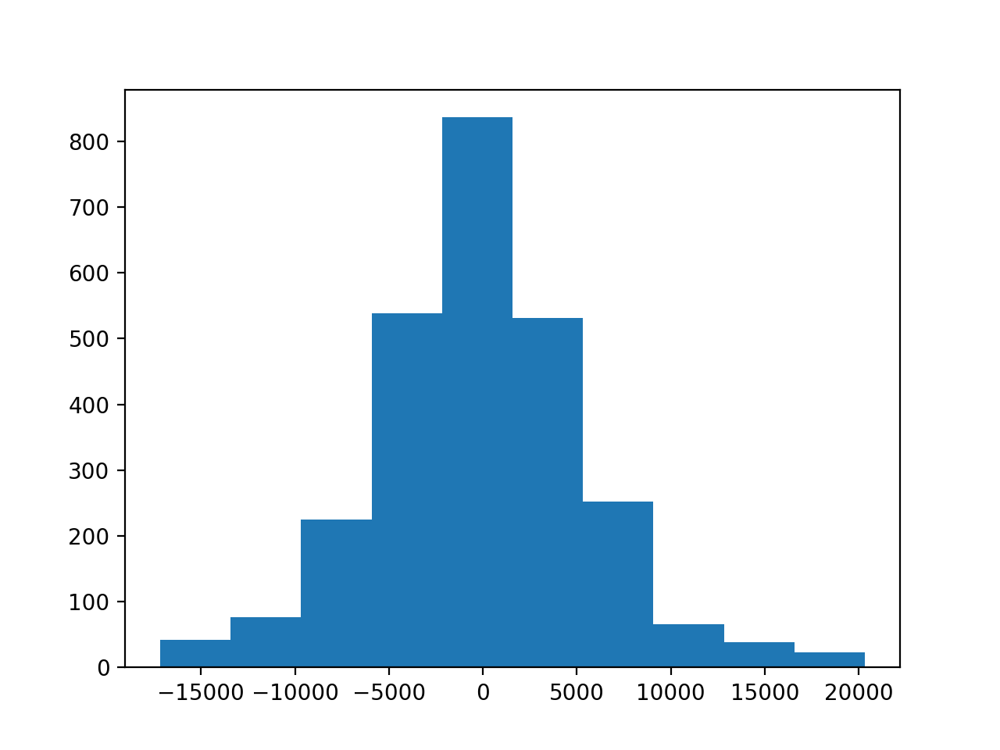

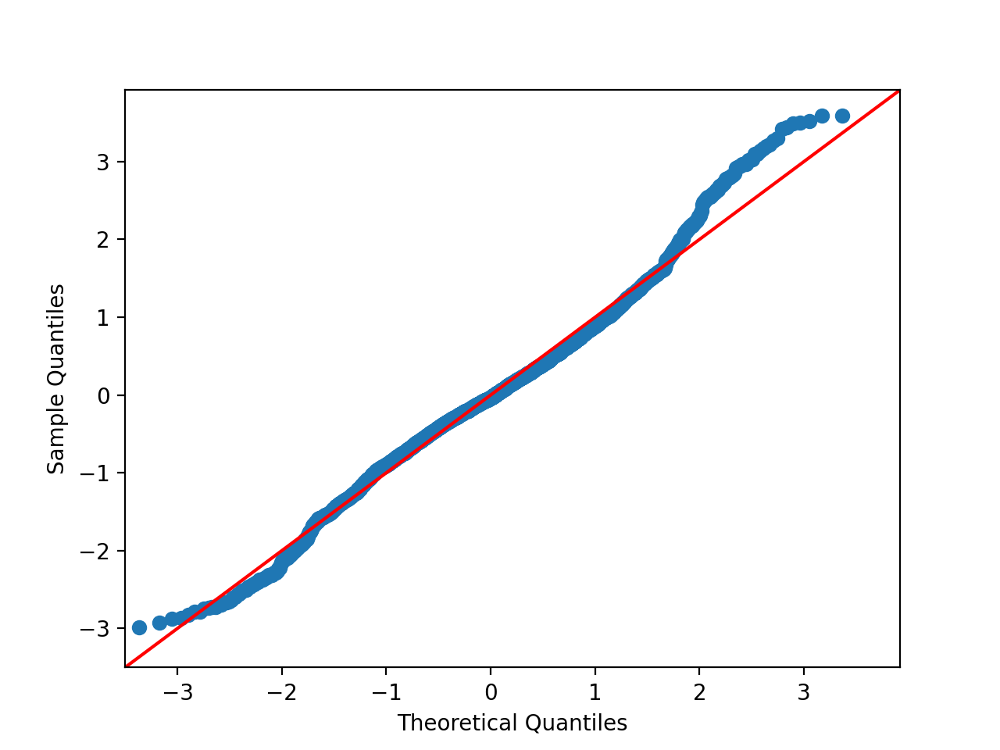

In [41]:
plt.hist(x=residuos)
sm.qqplot((residuos - residuos.mean())/ residuos.std(), line ='45') 
py.show() 

Podemos observar como las colas de los residuos son más notables que en una distribución normal. Esto nos indica cierto sesgo hacia la derecha, seguramente originado por los outliers que no hemos tratado. 

Debido a que los outliers restantes son abundantes he decidido no tratarlos. El R2 es elevado y podemos observar que la mayoría de residuos si que se comportan en cierta medida al comportamiento de una normal.

Observemos por último una prueba de homocedasticidad.

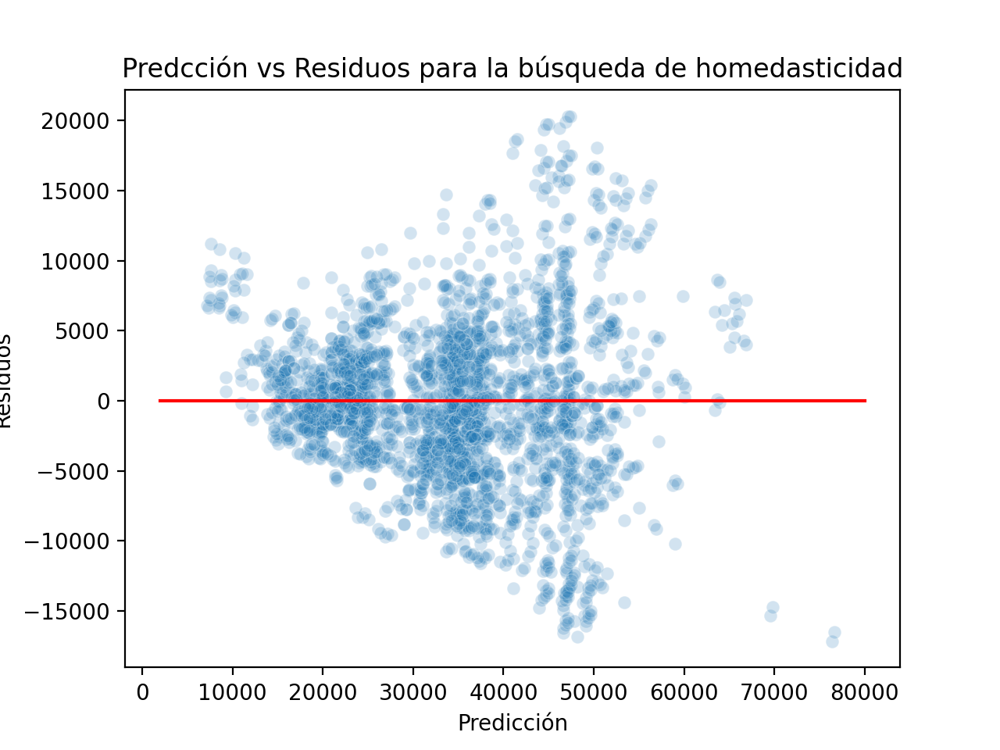

In [42]:
sns.scatterplot(x=predicted, y=residuos, alpha=0.2)
sns.lineplot(x=[2000,80000], y=[0,0], color='red')
plt.xlabel('Predicción')
plt.ylabel('Residuos')
plt.title('Predcción vs Residuos para la búsqueda de homedasticidad')
plt.show()

In [43]:
resultados = sms.het_goldfeldquandt(y=residuos, x=np.array(X_test, dtype=float))
resultados
print('El p-valor asociado a la prueba de homocedasticidad es:', resultados[1], 'este valor tan elevado nos indica que no podemos rechazar la hipótesis de que los residuos son homocedásticos. \nEsto es positivo de cara a nuestra regresión.')

El p-valor asociado a la prueba de homocedasticidad es: 0.949434217554885 este valor tan elevado nos indica que no podemos rechazar la hipótesis de que los residuos son homocedásticos. 
Esto es positivo de cara a nuestra regresión.


Por último, veamos una gráfica comparando los valores predecidos con los reales.

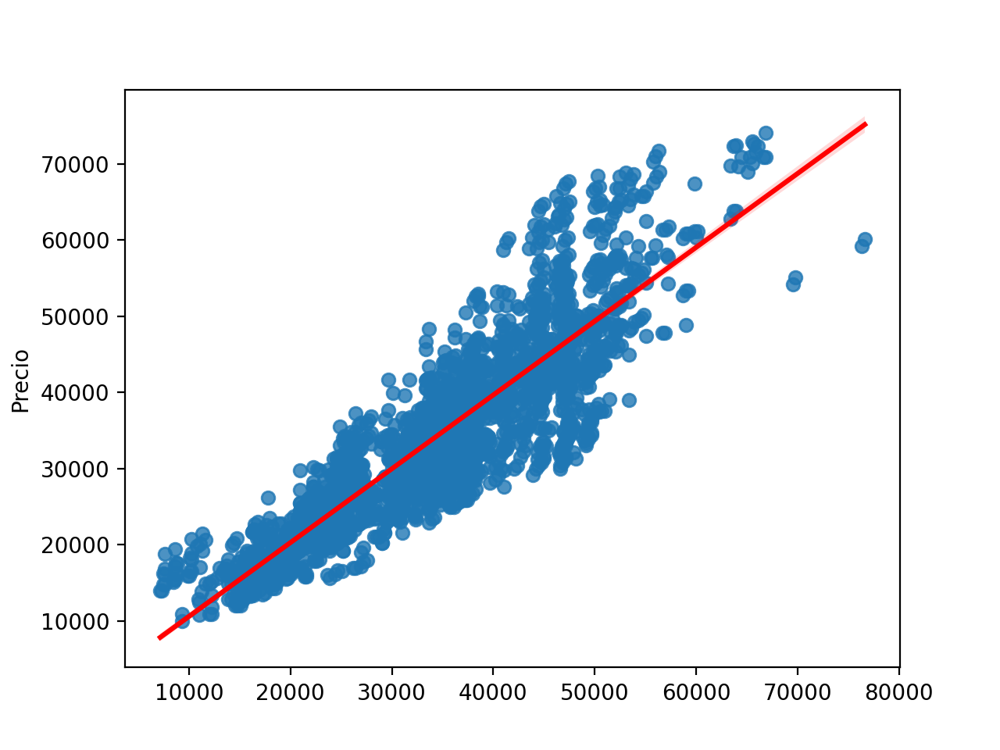

In [44]:
sns.regplot(x=predicted, y=y_test, line_kws={"color": "red"})
plt.show()

### 7. Conclusiones

Tras un profundo análisis podemos llegar a la conclusión general de que tenemos un buen modelo predictor para los coches de segunda mano.

Los datos iniciales estaban en su amplia mayoría completos y con buena calidad. Pese a esto, varias variables que podrían haber sido de ayuda tuvieron que ser desestimadas debido al gran número de categorías que poseían.
En algún caso alguna de estas categorías eran la misma presentandose de manera numérica y escrita.

Algunos de los datos presentaban valores de precio realmente altos que generaban mucho ruido a la hora de la construcción de nuestro modelo regresor. Para muchas de las variables, existía una tendencia distinta para los años previos al 2000, por lo que tuvimos que eliminar dichos datos.

Es así como tras una limpieza del dataset y entrenando un modelo lineal múltiple nos queda un R2 de aproximadamente 0,78, cuyos residuos no siguen una distribución normal pero donde no se descarta la presencia de homocedasticidad.

Estudiando los residuos observamos también cierto sesgo hacia la derecha, es por ello que se descartan modelos como Lasso o Ridge que añadirían incluso más sesgo.

En definitiva, el modelo no es perfecto, pero como una primera aproximación de ejecución rápida es aconsejable.